In [1]:
#%matplotlib notebook
#%run imports.py

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.gridspec import GridSpec
import string
import sys
import os 
import scipy as sp
from scipy import sparse
import sklearn

## add your packages ##

import time
import pickle
#import memory_profiler
from packaging.version import parse as parse_version
from memory_profiler import profile

# Load the memory_profiler extension
#get_ipython().run_line_magic('load_ext', 'memory_profiler')

from pathlib import Path

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture as GMM
from scipy import stats
import seaborn as sns
import umap
from sklearn.metrics import pairwise_distances
from scipy.stats import pearsonr
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import accuracy_score, recall_score
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors, NeighborhoodComponentsAnalysis
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import umap.umap_ as umap

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import igraph as ig
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import leidenalg as la
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

from Utils import *

c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import black
import jupyter_black

%load_ext jupyter_black

%load_ext watermark
%watermark --time --date --timezone --updated --python --iversions --watermark -p sklearn

jupyter_black.load(line_length=79)

Last updated: 2024-07-29 23:39:33Mitteleuropäische Sommerzeit

Python implementation: CPython
Python version       : 3.10.14
IPython version      : 8.26.0

sklearn: 1.5.1

igraph       : 0.11.6
seaborn      : 0.13.2
black        : 24.4.2
matplotlib   : 3.9.1
scipy        : 1.14.0
sklearn      : 1.5.1
leidenalg    : 0.10.2
jupyter_black: 0.3.4
umap         : 0.5.6
sys          : 3.10.14 | packaged by conda-forge | (main, Mar 20 2024, 12:40:08) [MSC v.1938 64 bit (AMD64)]
numpy        : 2.0.0
pandas       : 2.2.2

Watermark: 2.4.3



In [3]:
variables_path = Path("../results/variables")
figures_path = Path("../results/figures")
data_path = Path("../data")

In [4]:
plt.style.use("../matplotlib_style.txt")

In [5]:
np.random.seed(42)

# Data

We are going to use the multimodal data from the paper Scala et al. 2021 (https://www.nature.com/articles/s41586-020-2907-3#Sec7). In particular, you will work with transcriptomics and electrophysiological data. From the transcriptomics gene counts, we will only work with the exon counts for simplicity. Some of the electrophysiological features are not high-quality recordings, therefore we will also filter them out for the project.

## Import

### Meta data

In [6]:
# META DATA

meta = pd.read_csv(data_path / "m1_patchseq_meta_data.csv", sep="\t")

cells = meta["Cell"].values

layers = meta["Targeted layer"].values.astype("str")
cre = meta["Cre"].values
yields = meta["Yield (pg/µl)"].values
yields[yields == "?"] = np.nan
yields = yields.astype("float")
depth = meta["Soma depth (µm)"].values
depth[depth == "Slice Lost"] = np.nan
depth = depth.astype(float)
thickness = meta["Cortical thickness (µm)"].values
thickness[thickness == 0] = np.nan
thickness = thickness.astype(float)
traced = meta["Traced"].values == "y"
exclude = meta["Exclusion reasons"].values.astype(str)
exclude[exclude == "nan"] = ""

mice_names = meta["Mouse"].values
mice_ages = meta["Mouse age"].values
mice_cres = np.array(
    [c if c[-1] != "+" and c[-1] != "-" else c[:-1] for c in meta["Cre"].values]
)
mice_ages_dict = dict(zip(mice_names, mice_ages))
mice_cres = dict(zip(mice_names, mice_cres))

print("Number of cells with measured depth:    ", np.sum(~np.isnan(depth)))
print("Number of cells with measured thickness:", np.sum(~np.isnan(thickness)))
print("Number of reconstructed cells:          ", np.sum(traced))

sliceids = meta["Slice"].values
a, b = np.unique(sliceids, return_counts=True)
assert np.all(b <= 2)
print("Number of slices with two cells:        ", np.sum(b == 2))

# Some consistency checks
assert np.all(
    [np.unique(meta["Date"].values[mice_names == m]).size == 1 for m in mice_names]
)
assert np.all(
    [np.unique(meta["Mouse age"].values[mice_names == m]).size == 1 for m in mice_names]
)
assert np.all(
    [
        np.unique(meta["Mouse gender"].values[mice_names == m]).size == 1
        for m in mice_names
    ]
)
assert np.all(
    [
        np.unique(meta["Mouse genotype"].values[mice_names == m]).size == 1
        for m in mice_names
    ]
)
assert np.all(
    [np.unique(meta["Mouse"].values[sliceids == s]).size == 1 for s in sliceids]
)

Number of cells with measured depth:     1284
Number of cells with measured thickness: 1284
Number of reconstructed cells:           646
Number of slices with two cells:         69


### Transcriptomic data

In [7]:
# READ COUNTS

data_exons = pd.read_csv(
    data_path / "m1_patchseq_exon_counts.csv.gz", na_filter=False, index_col=0
)
exonCounts = data_exons.values.transpose()

assert all(cells == data_exons.columns)
genes = np.array(data_exons.index)

print("Count matrix shape (exon):  ", exonCounts.shape)

Count matrix shape (exon):   (1329, 42466)


In [8]:
data_exons

,20171204_sample_2,20171204_sample_4,20171204_sample_5,20171204_sample_6,20171207_sample_1,20171207_sample_2,20171207_sample_6,20171207_sample_7,20171219_sample_1,20171219_sample_2,...,20191114_sample_9,20200106_sample_1,20200106_sample_4,20200106_sample_5,20200106_sample_6,20200225_sample_2,20200225_sample_5,20200316_sample_1,20200316_sample_2,20200316_sample_3
0610005C13Rik,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
0610006L08Rik,0,0,0,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610009B22Rik,0,68,1291,0,0,0,227,0,7,10,...,0,271,0,0,0,0,138,0,78,89
0610009E02Rik,0,0,0,0,30,80,205,0,0,14,...,0,0,0,0,0,0,1,0,0,0
0610009L18Rik,0,0,0,0,0,99,0,380,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
n-R5s96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
n-R5s97,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
n-R5s98,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
n-TSaga9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
# GENE LENGTH

data = pd.read_csv(data_path / "gene_lengths.txt")
assert all(data["GeneID"] == genes)
exonLengths = data["exon_bp"].values
intronLengths = data["intron_bp"].values

### Cluster colors

In [10]:
cluster_colors = np.load(data_path / "cluster_colors.npy")

In [11]:
cluster_colors.shape
print(len(np.unique(cluster_colors)))

78


In [12]:
rna_type = np.load(data_path / "rna_type.npy", allow_pickle=True)

In [13]:
ephysData = pd.read_csv(data_path / "m1_patchseq_ephys_features.csv")

print(rna_type.shape)
print(rna_type)

(1329,)
['L5 ET_1' 'L5 IT_2' 'L5 IT_1' ... 'L5 ET_1' nan 'Pvalb Gpr149']


In [14]:
pickle_in = open(data_path / "dict_rna_type_colors.pkl", "rb")
dict_rna_type_colors = pickle.load(pickle_in)

In [15]:
print(dict_rna_type_colors)
rna_type_colors_array = np.array(list(dict_rna_type_colors.values()))
print(len(rna_type_colors_array))
print(len(np.unique(rna_type_colors_array)))

{'Lamp5 Pax6': '#DDACC9', 'Lamp5 Egln3_1': '#FF88AD', 'Lamp5 Egln3_2': '#DD8091', 'Lamp5 Egln3_3': '#F08E98', 'Lamp5 Pdlim5_1': '#FF7290', 'Lamp5 Pdlim5_2': '#FF8C97', 'Lamp5 Slc35d3': '#FFA388', 'Lamp5 Lhx6': '#C77963', 'Sncg Col14a1': '#7E0ACB', 'Sncg Slc17a8': '#9440F3', 'Sncg Calb1_1': '#9611B6', 'Sncg Calb1_2': '#9900B3', 'Sncg Npy2r': '#7A0099', 'Vip Sncg': '#AA4DB5', 'Vip Serpinf1_1': '#A720FF', 'Vip Serpinf1_2': '#AB1DFF', 'Vip Serpinf1_3': '#FF5FCD', 'Vip Htr1f': '#FF4DC1', 'Vip Gpc3': '#B09FFF', 'Vip C1ql1': '#BD3D9A', 'Vip Mybpc1_2': '#992E81', 'Vip Mybpc1_1': '#F70CF3', 'Vip Chat_1': '#FF00FF', 'Vip Mybpc1_3': '#AB379C', 'Vip Chat_2': '#B3128A', 'Vip Igfbp6_1': '#7779BF', 'Vip Igfbp6_2': '#626EB8', 'Sst Chodl': '#FFFF00', 'Sst Penk': '#FF8011', 'Sst Myh8_1': '#FF9F2C', 'Sst Myh8_2': '#FFB307', 'Sst Myh8_3': '#FFBF09', 'Sst Htr1a': '#BFAF00', 'Sst Etv1': '#FFB22B', 'Sst Pvalb Etv1': '#D9C566', 'Sst Crhr2_1': '#BE8652', 'Sst Crhr2_2': '#B0993C', 'Sst Hpse': '#CDB115', 'Sst Ca

### Electrophysiological features

In [16]:
# EPHYS DATA

ephysData = pd.read_csv(data_path / "m1_patchseq_ephys_features.csv")
ephysNames = np.array(ephysData.columns[1:]).astype(str)
ephysCells = ephysData["cell id"].values
ephysData = ephysData.values[:, 1:].astype("float")
names2ephys = dict(zip(ephysCells, ephysData))
ephysData = np.array(
    [names2ephys[c] if c in names2ephys else ephysData[0] * np.nan for c in cells]
)

print("Number of cells with ephys data:", np.sum(np.isin(cells, ephysCells)))

assert np.sum(~np.isin(ephysCells, cells)) == 0

Number of cells with ephys data: 1328


In [17]:
ephys_pd = pd.read_csv(data_path / "m1_patchseq_ephys_features.csv")

# print(ephys_pd["cell id"])
# print(ephys_pd.head())
# print(cells)

gene_data = pd.read_csv(data_path / "gene_lengths.txt")
print(gene_data.head())

          GeneID  exon_bp  intron_bp  gene_bp
0  0610005C13Rik     3583       3951     7534
1  0610006L08Rik     2128      32868    34996
2  0610009B22Rik      998       2491     3489
3  0610009E02Rik     1803      11892    13695
4  0610009L18Rik      619       1894     2513


In [18]:
# Filtering ephys data

features_exclude = [
    "Afterdepolarization (mV)",
    "AP Fano factor",
    "ISI Fano factor",
    "Latency @ +20pA current (ms)",
    "Wildness",
    "Spike frequency adaptation",
    "Sag area (mV*s)",
    "Sag time (s)",
    "Burstiness",
    "AP amplitude average adaptation index",
    "ISI average adaptation index",
    "Rebound number of APs",
]
features_log = [
    "AP coefficient of variation",
    "ISI coefficient of variation",
    "ISI adaptation index",
    "Latency (ms)",
]

X = ephysData

print(X.shape)
for e in features_log:
    X[:, ephysNames == e] = np.log(X[:, ephysNames == e])
X = X[:, ~np.isin(ephysNames, features_exclude)]

keepcells = ~np.isnan(np.sum(X, axis=1))
X = X[keepcells, :]
print(X.shape)

X = X - X.mean(axis=0)
ephysData_filtered = X / X.std(axis=0)

(1329, 29)
(1320, 17)


In [19]:
ephysData_filtered

array([[ 0.98608392,  0.64834158, -0.93881053, ...,  3.04737527,
         0.16776081,  0.63710672],
       [ 0.58728941,  0.45548548, -0.80161871, ...,  2.96590616,
        -0.76260223,  0.99778569],
       [ 0.36748484,  0.036109  , -0.11310118, ...,  3.04737527,
        -0.31069552,  1.05910185],
       ...,
       [ 0.66987131, -0.0487444 , -0.34647255, ...,  4.75822642,
         0.21211713,  0.73777371],
       [ 0.41921208,  0.55079968, -0.32063559, ...,  3.61765898,
         0.10267565,  1.50108896],
       [-0.50165036, -0.14969752, -0.01064697, ...,  0.76624039,
        -1.16822945, -1.10823434]])

In [20]:
np.sum(np.isnan(ephysData_filtered))

np.int64(0)

# Research questions to investigate

**1) Inspect the data computing different statistics.** Keep in mind that the data is read counts, not UMI, so it is not supposed to follow a Poisson distribution.

**2) Normalize and transform the data.** There are several ways of normalizing the data (Raw, CPM, CPMedian, RPKM, see https://www.reneshbedre.com/blog/expression_units.html, https://translational-medicine.biomedcentral.com/articles/10.1186/s12967-021-02936-w). Take into account that there are certain normalizations that only make sense for UMI data. You also explored different transformations in the assignment (none, log, sqrt). Compare how the different transformations change the two-dimensional visualization.

**3) Two-dimensional visualization.** Try different methods (t-SNE, UMAP) / parameters (exagg., perplex.) for visualizations. Compare them using quantitative metrics (e.g., distance correlation, kNN accuracy/recall in high-dim vs. two-dim). Think about also using the electrophysiological features for different visualizations.

**4) Clustering.** Try different clustering methods (leiden, GMM). Implement a negative binomial mixture model. For that you can follow a similar method that what is described in Harris et al. 2018 (https://journals.plos.org/plosbiology/article?id=10.1371/journal.pbio.2006387#abstract0), with fixed r (r=2) and S (set of important genes). Evaluate your clustering results (metrics, compare number of clusters to original labels,...).

**5) Correlation in between electrophysiological features and genes/PCs.** Find correlations and a way of visualizing them.

In [21]:
import json

# Convert rna_type to a Pandas Series if it is not already
rna_type = pd.Series(rna_type) if not isinstance(rna_type, pd.Series) else rna_type

# Remove NaNs from rna_type and count occurrences of each RNA type
rna_type_clean = rna_type.dropna()
rna_type_counts = rna_type_clean.value_counts().to_dict()

# Add a 'Not identified' key if there were NaNs in the original rna_type array
if rna_type.isnull().sum() > 0:
    rna_type_counts["Not identified"] = rna_type.isnull().sum()

# Sort the dictionary by keys
rna_type_counts = dict(sorted(rna_type_counts.items()))
# Move 'Not identified' to the end if it exists
if "Not identified" in rna_type_counts:
    rna_type_counts["Not identified"] = rna_type_counts.pop("Not identified")

# Create a DataFrame for cell types and their colors
cell_types = list(rna_type_counts.keys())
mapping_db = pd.DataFrame({"cell_types": cell_types})

# Assign colors to cell types
mapping_db["color"] = mapping_db["cell_types"].apply(
    lambda cell_type: dict_rna_type_colors.get(cell_type, "gray")
)

# Define marker lists based on the paper
excitatory_markers = [
    "L2/3 IT",
    "L4/5 IT",
    "L5 IT",
    "L6 IT",
    "L6b",
    "L6",
    "L5/6",
    "L5",
    "L6",
    "L2/3",
    "L4",
    "L5 IT",
    "L6 IT",
    "L6 CT",
    "L6b",
    "L6 CT",
]
cge_markers = ["Lamp5", "Sncg", "Vip"]
mge_markers = ["Sst", "Pvalb"]


# Assign types to cell types based on markers
def assign_type(cell_type):
    if any(marker in cell_type for marker in excitatory_markers):
        return "Excitatory neurons"
    if any(marker in cell_type for marker in cge_markers):
        return "CGE-derived interneurons"
    if any(marker in cell_type for marker in mge_markers):
        return "MGE-derived interneurons"
    return None


mapping_db["type"] = mapping_db["cell_types"].apply(assign_type)

# Add counts to the DataFrame
mapping_db["count"] = mapping_db["cell_types"].map(rna_type_counts)

# Sort the DataFrame by type and cell types
mapping_db = mapping_db.sort_values(by=["type", "cell_types"])

# Define groups
neuron_groups = [
    "Excitatory neurons",
    "CGE-derived interneurons",
    "MGE-derived interneurons",
]

In [22]:
def calculate_top_fano_factor(gene_expression_df, top_genes=500):
    """
    Calculate the top genes with the highest Fano factors.

    Parameters
    ----------
    gene_expression_df : pandas.DataFrame (n_genes, n_cells)
        The gene expression matrix.

    top_genes : int
        The number of top genes to return.

    Returns
    -------
    top_fano_factors : numpy.ndarray (top_genes,)
        The top Fano factors.

    top_gene_expression : pandas.DataFrame (n_genes, top_genes)

    """
    # Calculate the mean and variance of gene expression
    mean_expression = gene_expression_df.mean(axis=1)
    variance_expression = gene_expression_df.var(axis=1)

    # Calculate the Fano factor
    fano_factor = variance_expression / mean_expression

    # Exclude NaNs from fano_factor
    valid_indices = ~np.isnan(fano_factor)

    # Get non-NaN Fano factors and their corresponding indices
    valid_fano_factors = fano_factor[valid_indices]
    valid_gene_expression = gene_expression_df[valid_indices]

    # Sort the non-NaN Fano factors in descending order
    sorted_indices = np.argsort(-valid_fano_factors)

    # Select the top genes
    top_indices = sorted_indices[:top_genes]

    # Get the top genes and their Fano factors
    top_fano_factors = valid_fano_factors.iloc[top_indices]
    top_gene_expression = valid_gene_expression.iloc[top_indices]

    return top_fano_factors.values, top_gene_expression


# Calculate the top genes with the highest Fano factors

top_fano_factors, top_gene_expression = calculate_top_fano_factor(
    data_exons, top_genes=10
)


def calculate_top_fano_factor_array(gene_expression_array, top_genes=500):
    """
    Calculate the top genes with the highest Fano factors.

    Parameters
    ----------
    gene_expression_array : numpy.ndarray (n_cells, n_genes)
        The transposed gene expression matrix.

    top_genes : int
        The number of top genes to return.

    Returns
    -------
    top_fano_factors : numpy.ndarray (top_genes,)
        The top Fano factors.

    top_gene_expression : numpy.ndarray (top_genes, n_cells)
        The gene expression matrix for the top genes.
    """
    # Calculate the mean and variance of gene expression
    mean_expression = np.mean(gene_expression_array, axis=0)
    variance_expression = np.var(gene_expression_array, axis=0)

    # Calculate the Fano factor
    fano_factor = variance_expression / mean_expression

    # Exclude NaNs from fano_factor
    valid_indices = ~np.isnan(fano_factor)

    # Get non-NaN Fano factors and their corresponding indices
    valid_fano_factors = fano_factor[valid_indices]
    valid_gene_expression = gene_expression_array[:, valid_indices]

    # Sort the non-NaN Fano factors in descending order
    sorted_indices = np.argsort(-valid_fano_factors)

    # Select the top genes
    top_indices = sorted_indices[:top_genes]

    # Get the top genes and their Fano factors
    top_fano_factors = valid_fano_factors[top_indices]
    top_gene_expression = valid_gene_expression[:, top_indices]

    return top_fano_factors, top_gene_expression


# Print the top genes with the highest Fano factors and their corresponding fanos factors
# print(zip(top_gene_expression.index, top_fano_factors))

In [23]:
print(mice_names.shape)
print(exonCounts.shape)
mice_names_keep = mice_names[keepcells]
mice_ages_keep = mice_ages[keepcells]
cre_keep = cre[keepcells]
rna_type_keep = rna_type[keepcells]
exonCounts_keep = exonCounts[keepcells, :]
# compare variance of gene expression between mice to variance within mice
anova_results = []
# for each unique mice name get the indices of the cells
unique_mice_names = np.unique(mice_names_keep)
mice_cells = {}

print("Number of individual mice: ", len(unique_mice_names))
# print(unique_mice_names.shape)
for m in unique_mice_names:
    # Get indices of the cells for the current mouse
    mice_cell_indices = np.where(mice_names_keep == m)[0]

    # Get gene expression data for these cells
    gene_expression_data = exonCounts_keep[mice_cell_indices, :]

    # Store gene expression data in the dictionary
    mice_cells[m] = {
        "Gene_expression": gene_expression_data,
        "Variance": np.var(gene_expression_data, axis=0),
    }

# Assuming mice_cells is already populated with gene expression and variance data
# Step 1: Prepare the data for ANOVA
variances = []
group_labels = []

for mouse, data in mice_cells.items():
    gene_expression_var = np.var(data["Gene_expression"], axis=0)
    variances.extend(gene_expression_var)
    group_labels.extend([mouse] * gene_expression_var.shape[0])

# Create a DataFrame for easier handling
df = pd.DataFrame({"Variance": variances, "Mouse": group_labels})

# Step 2: Perform ANOVA
anova_result = stats.f_oneway(
    *(df[df["Mouse"] == mouse]["Variance"] for mouse in unique_mice_names)
)
anova_results.append(anova_result)
print(f"ANOVA result: F={anova_result.statistic}, p={anova_result.pvalue}")

# get samples with the same ages
unique_ages = np.unique(mice_ages_keep)
print("Number of unique ages: ", len(unique_ages))
age_cells = {}

for a in unique_ages:
    # Get indices of the cells for the current mouse
    age_cell_indices = np.where(mice_ages_keep == a)[0]

    # Get gene expression data for these cells
    gene_expression_data = exonCounts_keep[age_cell_indices, :]

    # Store gene expression data in the dictionary
    age_cells[a] = {
        "Gene_expression": gene_expression_data,
        "Variance": np.var(gene_expression_data, axis=0),
    }

# Assuming age_cells is already populated with gene expression and variance data
# Step 1: Prepare the data for ANOVA
variances_age = []
group_labels_age = []

for age, data in age_cells.items():
    gene_expression_var = np.var(data["Gene_expression"], axis=0)
    variances_age.extend(gene_expression_var)
    group_labels_age.extend([age] * gene_expression_var.shape[0])

# Create a DataFrame for easier handling
df_age = pd.DataFrame({"Variance": variances_age, "Age": group_labels_age})

# Step 2: Perform ANOVA
anova_result_age = stats.f_oneway(
    *(df_age[df_age["Age"] == age]["Variance"] for age in unique_ages)
)

print(f"ANOVA result: F={anova_result_age.statistic}, p={anova_result_age.pvalue}")
anova_results.append(anova_result_age)

# get samples with the same cre type
unique_cre_types = np.unique(cre_keep)
print("Number of unique cre types: ", len(unique_cre_types))
cre_cells = {}

print(cre_keep.shape)
print(exonCounts_keep.shape)

for c in unique_cre_types:
    # Get indices of the cells for the current cre type
    cre_cell_indices = np.where(cre_keep == c)[0]

    # Get gene expression data for these cells
    gene_expression_data = exonCounts_keep[cre_cell_indices, :]

    # Store gene expression data in the dictionary
    cre_cells[c] = {
        "Gene_expression": gene_expression_data,
        "Variance": np.var(gene_expression_data, axis=0),
    }

# Assuming cre_cells is already populated with gene expression and variance data
# Step 1: Prepare the data for ANOVA
variances_cre = []
group_labels_cre = []

for cre_type, data in cre_cells.items():
    gene_expression_var = np.var(data["Gene_expression"], axis=0)
    variances_cre.extend(gene_expression_var)
    group_labels_cre.extend([cre_type] * gene_expression_var.shape[0])

# Create a DataFrame for easier handling
df_cre = pd.DataFrame({"Variance": variances_cre, "Cre": group_labels_cre})

# Step 2: Perform ANOVA
anova_result_cre = stats.f_oneway(
    *(df_cre[df_cre["Cre"] == cre_type]["Variance"] for cre_type in unique_cre_types)
)

print(f"ANOVA result: F={anova_result_cre.statistic}, p={anova_result_cre.pvalue}")
anova_results.append(anova_result_cre)

# get samples with the same rna type
# reset rna_type_keep index
rna_type_keep = rna_type_keep.reset_index(drop=True)

# print number of nan
print("Number of NaN values in rna_type: ", rna_type_keep.isnull().sum())

nan_mask = rna_type_keep.notna()

# Apply the mask to rna_type_array and exonCounts_keep
rna_type_filtered = rna_type_keep[nan_mask]

# reset rna_type_filtered index
rna_type_filtered = rna_type_filtered.reset_index(drop=True)

exonCounts_filtered = exonCounts_keep[nan_mask.values, :]

# Get unique RNA types
unique_rna_types = rna_type_filtered.unique()
print("Number of unique RNA types: ", len(unique_rna_types))

# Dictionary to store gene expression data and variances for each RNA type
rna_type_cells = {}

print(exonCounts_filtered.shape)
print(rna_type_filtered.shape)
for r in unique_rna_types:
    # Get indices of the cells for the current RNA type
    rna_type_cell_indices = rna_type_filtered[rna_type_filtered == r].index

    # Get gene expression data for these cells
    gene_expression_data = exonCounts_filtered[rna_type_cell_indices, :]

    # Store gene expression data and variance in the dictionary
    rna_type_cells[r] = {
        "Gene_expression": gene_expression_data,
        "Variance": np.var(gene_expression_data, axis=0),
    }

# Prepare data for ANOVA
variances_rna_type = []
group_labels_rna_type = []

for rna_type, data in rna_type_cells.items():
    gene_expression_var = data["Variance"]
    variances_rna_type.extend(gene_expression_var)
    group_labels_rna_type.extend([rna_type] * gene_expression_var.shape[0])

# Create a DataFrame for easier handling
df_rna_type = pd.DataFrame(
    {"Variance": variances_rna_type, "RNA type": group_labels_rna_type}
)

# Perform ANOVA
anova_result_rna_type = stats.f_oneway(
    *(
        df_rna_type[df_rna_type["RNA type"] == rna_type]["Variance"]
        for rna_type in unique_rna_types
    )
)

print(
    f"ANOVA result: F={anova_result_rna_type.statistic}, p={anova_result_rna_type.pvalue}"
)
anova_results.append(anova_result_rna_type)

(1329,)
(1329, 42466)
Number of individual mice:  266
ANOVA result: F=1.8181509337239867, p=8.707167539633704e-15
Number of unique ages:  102
ANOVA result: F=1.6501309746297719, p=4.289434383754619e-05
Number of unique cre types:  18
(1320,)
(1320, 42466)
ANOVA result: F=2.3163657955246326, p=0.0015829130359728523
Number of NaN values in rna_type:  96
Number of unique RNA types:  76
(1224, 42466)
(1224,)
ANOVA result: F=1.7226515321740707, p=0.00010219613389086996


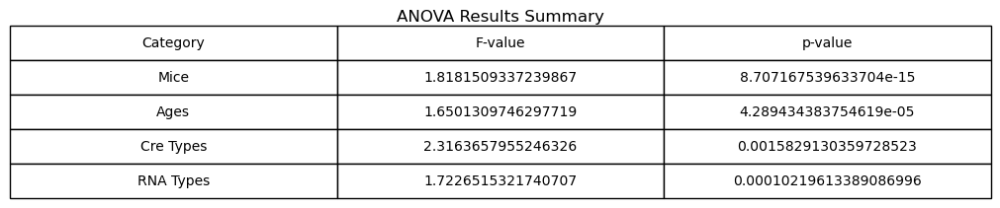

In [24]:
# Data
from matplotlib.table import Table

categories = ["Mice", "Ages", "Cre Types", "RNA Types"]

f_values = []
p_values = []

for i in range(len(anova_results)):
    f_values.append(anova_results[i].statistic)
    p_values.append(anova_results[i].pvalue)


# Create DataFrame for table
data = {"Category": categories, "F-value": f_values, "p-value": p_values}
df = pd.DataFrame(data)

# Plot
fig, ax = plt.subplots(figsize=(10, 2))  # Set figure size
ax.axis("off")  # Hide axes

# Create table
table = ax.table(
    cellText=df.values,
    colLabels=df.columns,
    cellLoc="center",
    loc="center",
    bbox=[0, 0, 1, 1],
)

# Style the table
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.2)

plt.title("ANOVA Results Summary")
plt.show()

### Transcriptomics data exploration

For the transcriptomics data we calculated the mean expression levels (in counts) per cell and plotted against the fraction of zero expression genes in said cell.

[264.97393209 138.57627278 435.15259266 ...   9.30473791  11.06779541
   9.80271276]


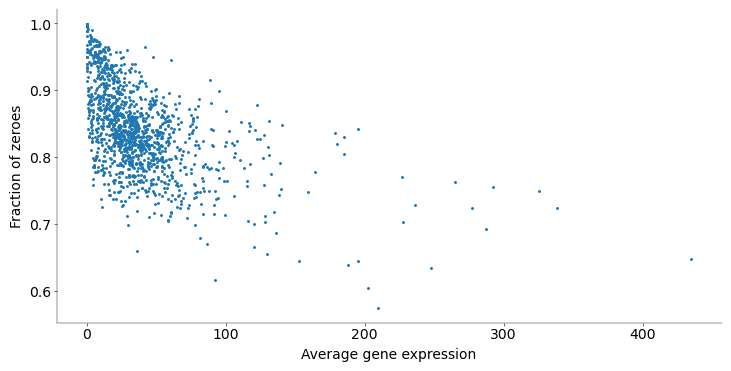

In [25]:
# calculate the average gene expression for each cell
average_gene_expression = np.mean(exonCounts, axis=1)
print(average_gene_expression)
# compute the fraction of zeroes for each cell
fraction_zeroes = np.sum(exonCounts == 0, axis=1) / exonCounts.shape[1]

# plot the average gene expression against the fraction of zeroes
plt.figure()
plt.scatter(average_gene_expression, fraction_zeroes, s=5)
plt.xlabel("Average gene expression")
plt.ylabel("Fraction of zeroes")
plt.show()

In [26]:
# normalisation using bioinfotoolkit
from bioinfokit.analys import norm, get_data

# print head of the data
# print("raw data: ", data_exons.head(2))

# using cpm normalization
nm = norm()
nm.cpm(df=data_exons)
# get CPM normalized dataframe
cpm_df = nm.cpm_norm
cpm_df.head(2)


# using rpkm normalization
# print(exonLengths, exonLengths.shape)

# add gene length to the corresponding gene id
# find the matching gene id in data exons and gene data and add the gene length to the data exons
data_genes = pd.read_csv(data_path / "gene_lengths.txt")

data_exons.index.name = "GeneID"

# Perform the merge
merged_exon_data = pd.merge(data_exons, data_genes, on="GeneID", how="left")
merged_exon_data.set_index("GeneID", inplace=True)
# Print the head of the merged data
# print("merged: ", merged_exon_data.head(2))

nm.rpkm(df=merged_exon_data, gl="exon_bp")

# get RPKM normalized dataframe
rpkm_df = nm.rpkm_norm

# print("RPKM normalized data: ", rpkm_df.head(2))

# using tpm normalization

nm.tpm(df=merged_exon_data, gl="exon_bp")

# get TPM normalized dataframe
tpm_df = nm.tpm_norm

# print("TPM normalized data: ", tpm_df.head(2))

Next we normalized with CPM (counts per million) and plotted fraction of zeros and variance of expression and the fano factor  against the average gene expression. We color coded the dots by the log fano factor and plotted the Poisson expectation for the zero count; we can see that the data is shifted rightwards in comparison.

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\2904957403.py:5: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_gene_expression / average_gene_expression_cpm
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\2904957403.py:21: RuntimeWarning: divide by zero encountered in log10
  np.log10(average_gene_expression_cpm),
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\2904957403.py:31: RuntimeWarning: divide by zero encountered in log10
  np.log10(np.unique(average_gene_expression_cpm)),


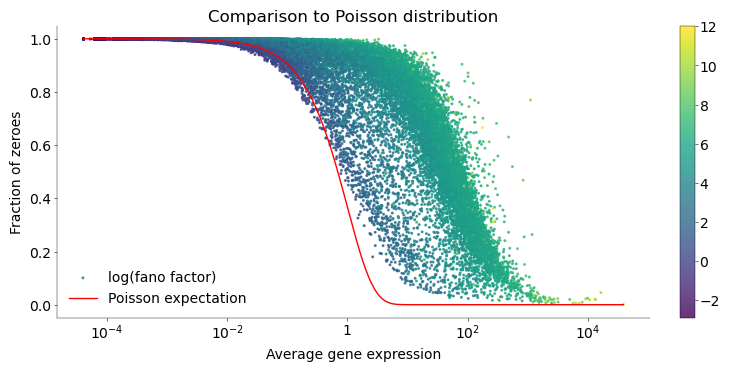

In [29]:
### for the cpm data
cpm_exonCounts = cpm_df.values.transpose()
average_gene_expression_cpm = np.mean(cpm_exonCounts, axis=0)
variance_gene_expression = np.var(cpm_exonCounts, axis=0)
fano_factor = variance_gene_expression / average_gene_expression_cpm


# calculate the average gene expression for each cell


# compute the fraction of zeroes for each cell
fraction_zeroes_cpm = np.mean(cpm_exonCounts == 0, axis=0)

# Add Hertie logo in sign of gratitude of our exellent lecturers and Exersize class support.
plt.figure()
# img = plt.imread("We_love_Hertie_so_much_we_cant_even_express_it_in_words.png")
# plt.imshow(img, extent=[-4, 4, 0, 1], aspect="auto")

# plot the average gene expression against the fraction of zeroes
plt.scatter(
    np.log10(average_gene_expression_cpm),
    fraction_zeroes_cpm,
    s=5,
    c=np.log(fano_factor),
    label="log(fano factor)",
    alpha=0.8,
)  # np.arange(len(average_gene_expression_cpm)))

y = np.exp(-np.unique(average_gene_expression_cpm))
plt.plot(
    np.log10(np.unique(average_gene_expression_cpm)),
    y,
    color="red",
    label="Poisson expectation",
)
plt.legend()
plt.xlabel("Average gene expression")
plt.ylabel("Fraction of zeroes")
plt.title("Comparison to Poisson distribution")
plt.colorbar()

# make the plot loglog
# plt.xscale("log")
# plt.yscale("log")
plt.xticks([-4, -2, 0, 2, 4], ["$10^{-4}$", "$10^{-2}$", "1", "$10^{2}$", "$10^{4}$"])
plt.show()

#### Mean-variance analysis. 
Scatter plot of expression variance against average expression and compare to the diagonal.

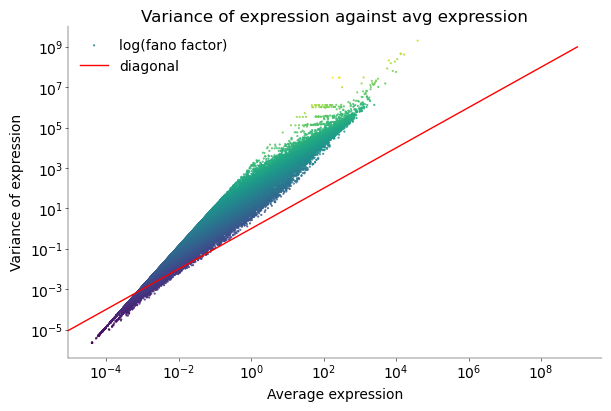

In [30]:
fig, ax = plt.subplots(figsize=(6, 4))

ax.scatter(
    average_gene_expression_cpm,
    variance_gene_expression,
    s=1,
    c=np.log(fano_factor),
    label="log(fano factor)",
)
ax.plot([0, 10**9], [0, 10**9], color="red", label="diagonal")

# add labels
ax.set_xlabel("Average expression")
ax.set_ylabel("Variance of expression")
# add legend
ax.legend()
plt.title("Variance of expression against avg expression")
# make axis logarithmix
ax.set_xscale("log")
ax.set_yscale("log")


plt.show()

Scattering the Variance of expression against the average expression level we see a deviation form the diagonal. One again the scattered data was color coded by the fano factor.

#### Plotting the Fano factor against the average expression level

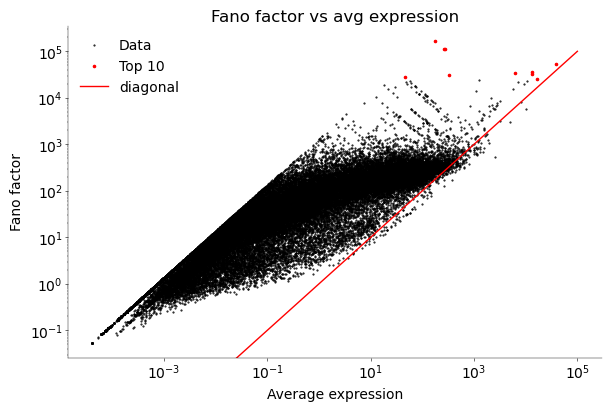

In [31]:
fig, ax = plt.subplots(figsize=(6, 4))
fano_nan = fano_factor[~np.isnan(fano_factor)]
avg_nan = average_gene_expression_cpm[~np.isnan(fano_factor)]
ax.scatter(average_gene_expression_cpm, fano_factor, s=1, color="black", label="Data")
top10 = np.argsort(fano_nan)[-10:]
# print(top10)

# mark the top 10 fanofactors red
ax.scatter(
    avg_nan[top10],
    fano_nan[top10],
    s=10,
    color="red",
    label="Top 10",
)
ax.plot([0, 10**5], [0, 10**5], color="red", label="diagonal")

# add labels
ax.set_xlabel("Average expression")
ax.set_ylabel("Fano factor")
# add legend
ax.legend()
ax.set_title("Fano factor vs avg expression")

# make axis logarithmic
ax.set_xscale("log")
ax.set_yscale("log")
plt.show()

Plotting the fano factor agains the average expression we see that most values lie above the diagonal, ie for most genes $F\ge E[Expression]$. Marked with red dots are the 10 genes with the highest Fano factor.


#### Histogram of sequencing depth 

Next we plotted the distibution of sequencing depth and the variance of expression and printed out which genes corresponded to the highest fano factor, therefore promising a potential role in cellular differentiation between the invesitgated neurons.

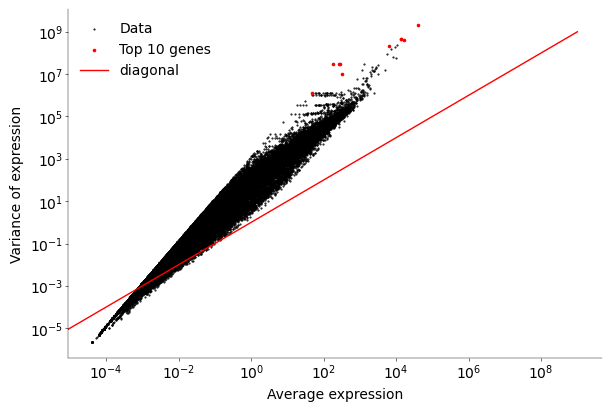

In [32]:
# Exclude NaNs from fano_factor
valid_indices = ~np.isnan(fano_factor)

# Get non-NaN Fano factors and their corresponding indices
valid_fano_factors = fano_factor[valid_indices]
valid_genes = np.array(genes)[valid_indices]
valid_average_gene_expression_cpm = average_gene_expression_cpm[valid_indices]
valid_variance_gene_expression = variance_gene_expression[valid_indices]

# Sort the non-NaN Fano factors in descending order
sorted_indices = np.argsort(-valid_fano_factors)

# Select the top 10 genes
top10_indices = sorted_indices[:10]

# Create the plot
fig, ax = plt.subplots(figsize=(6, 4))


# Scatter plot for all data
ax.scatter(
    valid_average_gene_expression_cpm,
    valid_variance_gene_expression,
    s=1,
    color="black",
    label="Data",
)

# Highlight the top 10 genes
ax.scatter(
    valid_average_gene_expression_cpm[top10_indices],
    valid_variance_gene_expression[top10_indices],
    s=10,
    color="red",
    label="Top 10 genes",
)


ax.plot([0, 10**9], [0, 10**9], color="red", label="diagonal")

# Add labels
ax.set_xlabel("Average expression")
ax.set_ylabel("Variance of expression")
# Add legend
ax.legend()

# Make axis logarithmic
ax.set_xscale("log")
ax.set_yscale("log")
plt.show()

In [33]:
# Find top-10 genes with the highest normalized Fano factor
# Print them sorted by the Fano factor starting from the highest

# Find indices of non-NaN values
valid_indices = ~np.isnan(fano_factor)

# Get non-NaN Fano factors and their corresponding indices
valid_fano_factors = fano_factor[valid_indices]
valid_genes = np.array(genes)[valid_indices]

# Sort the non-NaN Fano factors in descending order
sorted_indices = np.argsort(-valid_fano_factors)

# Print the top 10 genes with the highest normalized Fano factor
print("Top 10 genes with the highest normalized Fano factor:")
for i in range(10):
    print(
        f"{valid_genes[sorted_indices[i]]}: {valid_fano_factors[sorted_indices[i]]:.2f}"
    )

# Give max value of the Fano factor excluding NaNs
max_fano = np.nanmax(fano_factor)
print("Max Fano factor:", max_fano)

Top 10 genes with the highest normalized Fano factor:
Nectin2: 169717.99
Scai: 113449.80
Thoc2: 109742.37
CT010467.1: 52284.37
ERCC-00130: 35841.41
Rn7s1: 34081.25
ERCC-00074: 32902.02
Mir6236: 31180.47
Atg10: 27783.79
Gm26917: 25380.96
Max Fano factor: 169717.99145220438


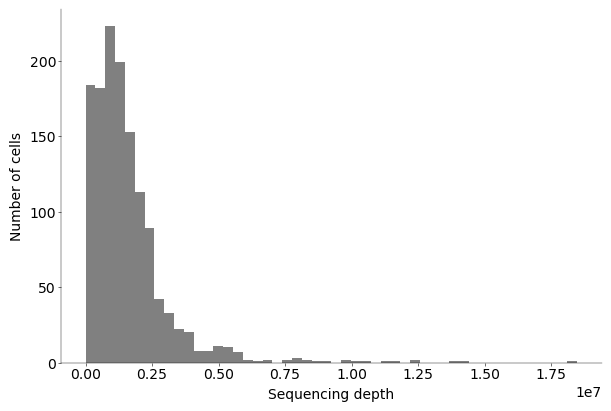

In [34]:
# plot sequencing depth
fig, ax = plt.subplots(figsize=(6, 4))

ax.hist(exonCounts.sum(axis=1), bins=50, color="grey")
# add labels
ax.set_xlabel("Sequencing depth")
ax.set_ylabel("Number of cells")
plt.show()

### Two-dimensional visualisation of the transcriptomics data

For the upcoming analysis we use normallised counts, log counts and sqrt counts with the different respective normalization techniques.For log counts the data isshifted by 1 to avoid NaN entries in consequence of zero counts:

In [35]:
# # # get exon count data
# # exonCounts = data_exons
# # gene_length = gene_data
# # normalise the data using cpm

from Utils import normalize_count_data, perform_pca, plot_pca_embedding

# normalise the data using cpm, housekeeping method, tpm and rpkm
norm_methods = ["cpm", "tpm", "rpkm", "housekeeping", "total_counts"]
# Include raw data
norm_data = {"Raw": exonCounts[keepcells, :]}
transform_labels = ["log", "sqrt", "log_sqrt", "no"]
transform_methods = ["log", "sqrt", "log_sqrt", [None]]

pca_results = {}

for i, n_method in enumerate(norm_methods):
    norm_exonCounts = normalize_count_data(
        data_exons, data_genes=gene_data, method=n_method
    )
    norm_data[n_method] = norm_exonCounts
    print(norm_exonCounts.shape)

    for j, t_method in enumerate(transform_methods):
        pca_norm, pca_norm_model = perform_pca(
            norm_data[n_method][keepcells, :],
            transformation=t_method,
            standardize=False,
        )
        pca_results[(n_method, transform_labels[j])] = pca_norm, pca_norm_model

for j, t_method in enumerate(transform_methods):
    pca_raw, pca_raw_model = perform_pca(
        exonCounts[keepcells, :], transformation=t_method, standardize=False
    )
    pca_results[("Raw", transform_labels[j])] = pca_raw, pca_raw_model

# plot the pca embedding
print(cluster_colors[keepcells].shape)


# get the 1000 highest fano factor genes
top_fano_factors, top_gene_expression = calculate_top_fano_factor(
    data_exons, top_genes=1000
)
print(top_gene_expression.shape)
pca_results_fano = {}


for i, n_method in enumerate(norm_methods):
    norm_exonCounts = normalize_count_data(
        data_exons, data_genes=gene_data, method=n_method
    )
    norm_data[n_method] = norm_exonCounts
    print(norm_exonCounts.shape)

    for j, t_method in enumerate(transform_methods):
        pca_norm, pca_norm_model = perform_pca(
            norm_data[n_method][keepcells, :],
            transformation=t_method,
            standardize=False,
        )
        pca_results_fano[(n_method, transform_labels[j])] = pca_norm, pca_norm_model

(1329, 42466)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]
(1329, 42466)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]
(1329, 42466)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]
Housekeeping genes: ['Actb', 'Gapdh', 'Ubc', 'Hprt'] Index(['Actb', 'Gapdh', 'Ubc', 'Hprt'], dtype='object', name='

In [36]:
print(norm_data.keys())

dict_keys(['Raw', 'cpm', 'tpm', 'rpkm', 'housekeeping', 'total_counts'])


c:\Users\Arne.Gittel\Documents\Neuro Master\Neural data science\practicals\Final project\Final_Project\NDS_project\notebooks\Utils.py:698: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\matplotlib\collections.py:1109: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\1898982888.py:57: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


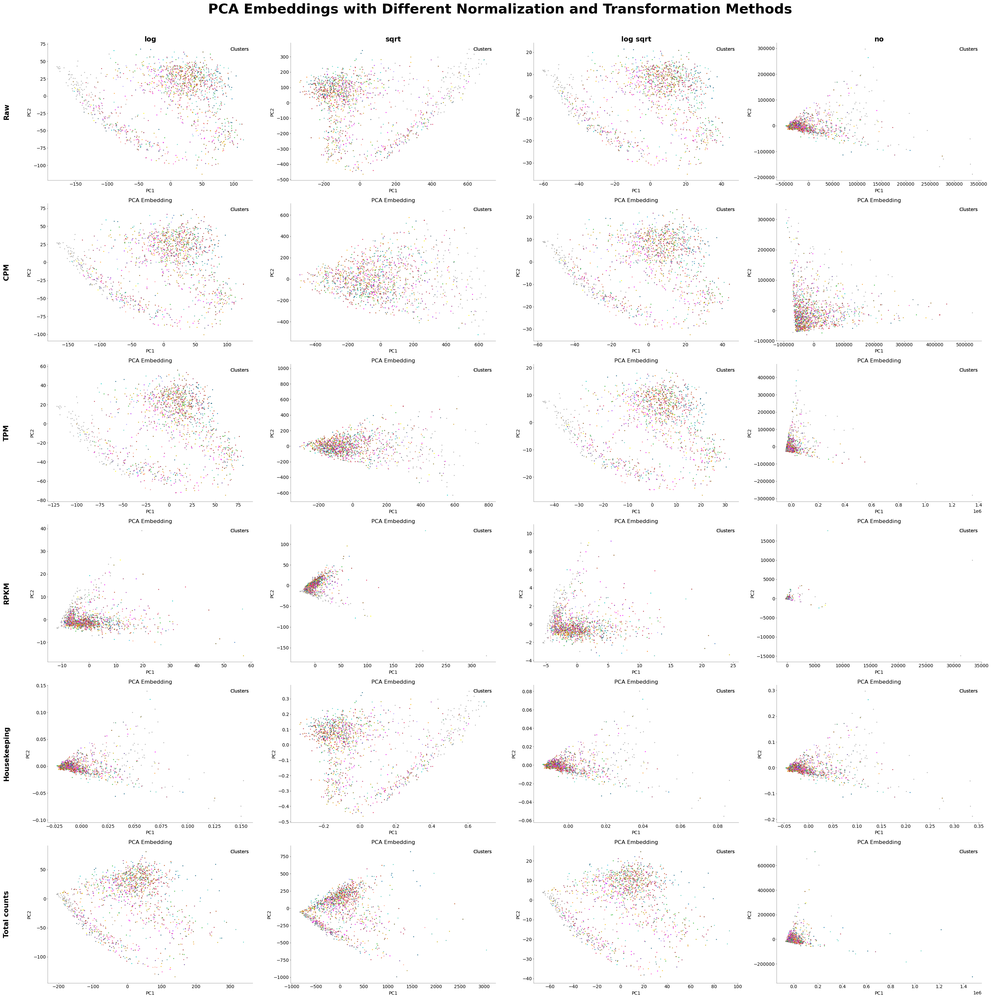

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\1898982888.py:123: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


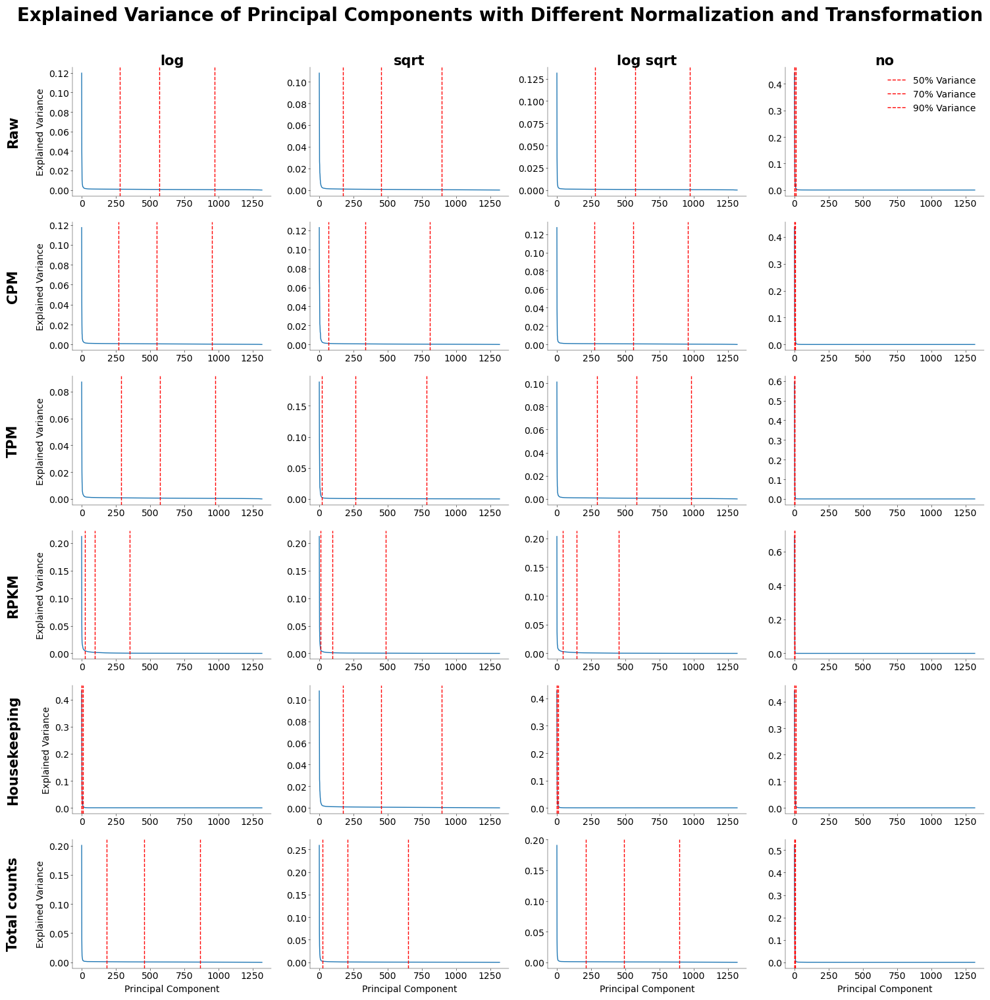

In [37]:
# Create subplots with 2 rows and 3 columns
fig, axs = plt.subplots(6, 4, figsize=(30, 30))

# Flatten the axs array for easier indexing
axs = axs.flatten()

norm_methods_ = ["Raw", "CPM", "TPM", "RPKM", "Housekeeping", "Total counts"]
transformations_ = ["log", "sqrt", "log sqrt", "no"]


# Iterate through the PCA results and plot the embeddings and explained variance
for i, (key, value) in enumerate(pca_results.items()):
    # Plot PCA embedding
    plot_pca_embedding(
        value[0],
        labels=cluster_colors[keepcells],
        # title=f"PCA Embedding with {key[0]} Normalization and {key[1]} Transformation, explained variance: PC1: {value[1].explained_variance_ratio_[0]:.2f}, PC2: {value[1].explained_variance_ratio_[1]:.2f}",
        # keepcells=keepcells,
        ax=axs[i],
    )
    (
        axs[i].set_title(
            transformations_[i],
            fontweight="bold",
            fontsize=15,
        )
        if i < 4
        else None
    )

    # print text next to y axis
    (
        axs[i].text(
            -0.2,
            0.5,
            norm_methods_[int(i // 4)],
            transform=axs[i].transAxes,
            fontsize=15,
            rotation=90,
            va="center",
            ha="center",
            fontweight="bold",
        )
        if i % 4 == 0
        else None
    )


plt.suptitle(
    "PCA Embeddings with Different Normalization and Transformation Methods",
    x=0.5,
    y=1.01,
    ha="center",
    fontsize=30,
    fontweight="bold",
)
plt.tight_layout()


plt.show()

fig, axs = plt.subplots(6, 4, figsize=(15, 15))
axs = axs.flatten()

# Iterate through the PCA results again and plot the explained variance
for i, (key, value) in enumerate(pca_results.items()):
    explained_variance_ratio = value[1]
    cumulative_variance = np.cumsum(explained_variance_ratio)

    # Plot the explained variance of all the principal components
    axs[i].plot(explained_variance_ratio)  # , marker='o', label='Explained Variance')

    # Add vertical lines for 50%, 70%, and 90% cumulative variance
    for threshold in [0.5, 0.7, 0.9]:
        # Find the index where cumulative variance exceeds the threshold
        index = np.argmax(cumulative_variance >= threshold)
        axs[i].axvline(
            x=index,
            linestyle="--",
            color="r",
            label=f"{int(threshold * 100)}% Variance",
        )
        (
            axs[i].set_title(
                transformations_[i],
                fontweight="bold",
                fontsize=15,
            )
            if i < 4
            else None
        )

    (
        axs[i].text(
            -0.3,
            0.5,
            norm_methods_[i // 4],
            transform=axs[i].transAxes,
            fontsize=15,
            rotation=90,
            va="center",
            ha="center",
            fontweight="bold",
        )
        if i % 4 == 0
        else None
    )

    # axs[i].set_title(f"Explained Variance: {key[0]} Norm & {key[1]} Trans")
    axs[i].set_xlabel("Principal Component") if i >= 20 else None
    axs[i].set_ylabel("Explained Variance") if i % 4 == 0 else None
    axs[i].legend() if i == 3 else None


plt.suptitle(
    "Explained Variance of Principal Components with Different Normalization and Transformation",
    x=0.5,
    y=1.01,
    ha="center",
    fontsize=20,
    fontweight="bold",
)
plt.tight_layout()
plt.show()

In the overview we can see that the most efficient PCA projection is achieved by the log (or lig sqrt) transformation on the Housekeeping normalized data. As well as for, surprisingly, the untransformed data. We repeated the procedure for the subset of top 1000 genes by their Fano factor.


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\690074641.py:80: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_expression / mean_expression


(1320, 1000)


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\690074641.py:80: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_expression / mean_expression


TGE:,  (1329, 1000)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\690074641.py:80: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_expression / mean_expression


TGE:,  (1329, 1000)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\690074641.py:80: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_expression / mean_expression


TGE:,  (1329, 1000)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]
Housekeeping genes: ['Actb', 'Gapdh', 'Ubc', 'Hprt'] Index(['Actb', 'Gapdh', 'Ubc', 'Hprt'], dtype='object', name='GeneID')


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\690074641.py:80: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_expression / mean_expression


TGE:,  (1329, 1000)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\690074641.py:80: RuntimeWarning: invalid value encountered in divide
  fano_factor = variance_expression / mean_expression


TGE:,  (1329, 1000)
Performing PCA...
Transformation:  log
Log-transforming data...
Performing PCA...
Transformation:  sqrt
Square root-transforming data...
Performing PCA...
Transformation:  log_sqrt
Log-transforming data...
Square root-transforming data...
Performing PCA...
Transformation:  [None]


c:\Users\Arne.Gittel\Documents\Neuro Master\Neural data science\practicals\Final project\Final_Project\NDS_project\notebooks\Utils.py:698: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\matplotlib\collections.py:1109: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\2414870450.py:82: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


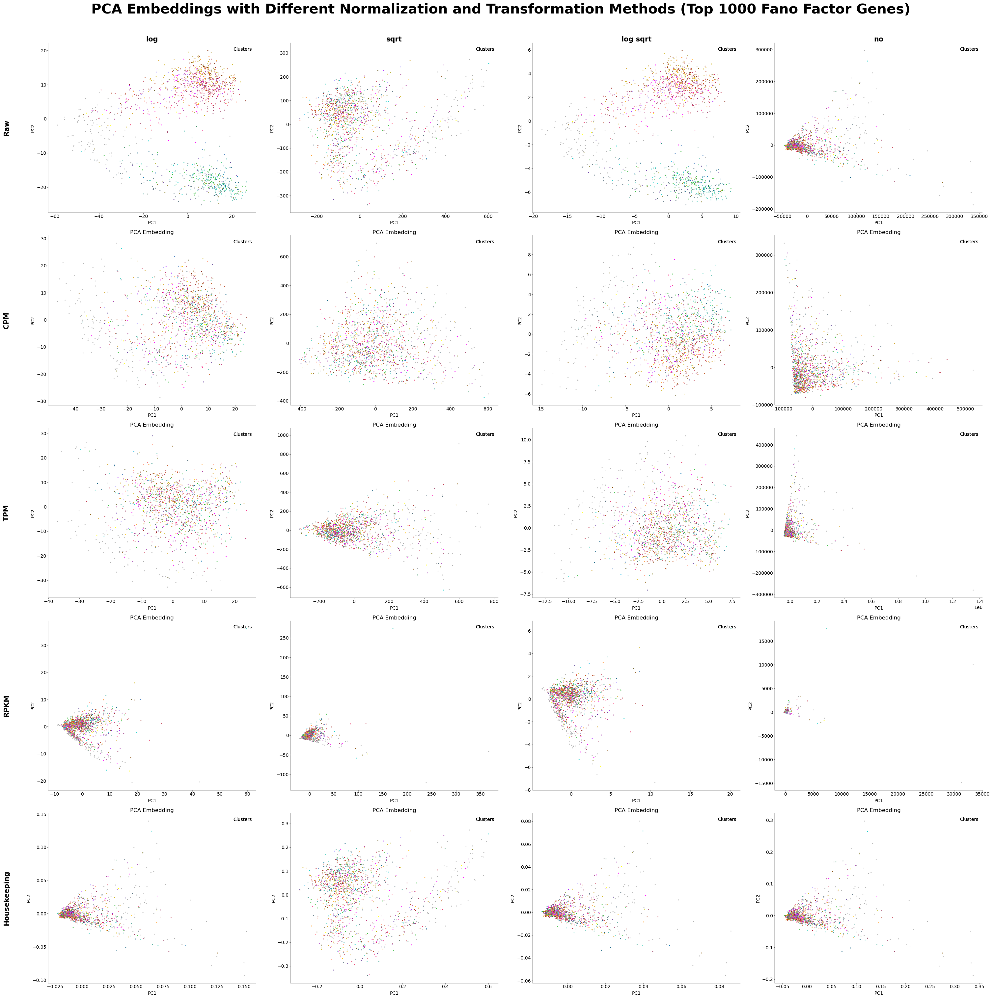

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\2414870450.py:151: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


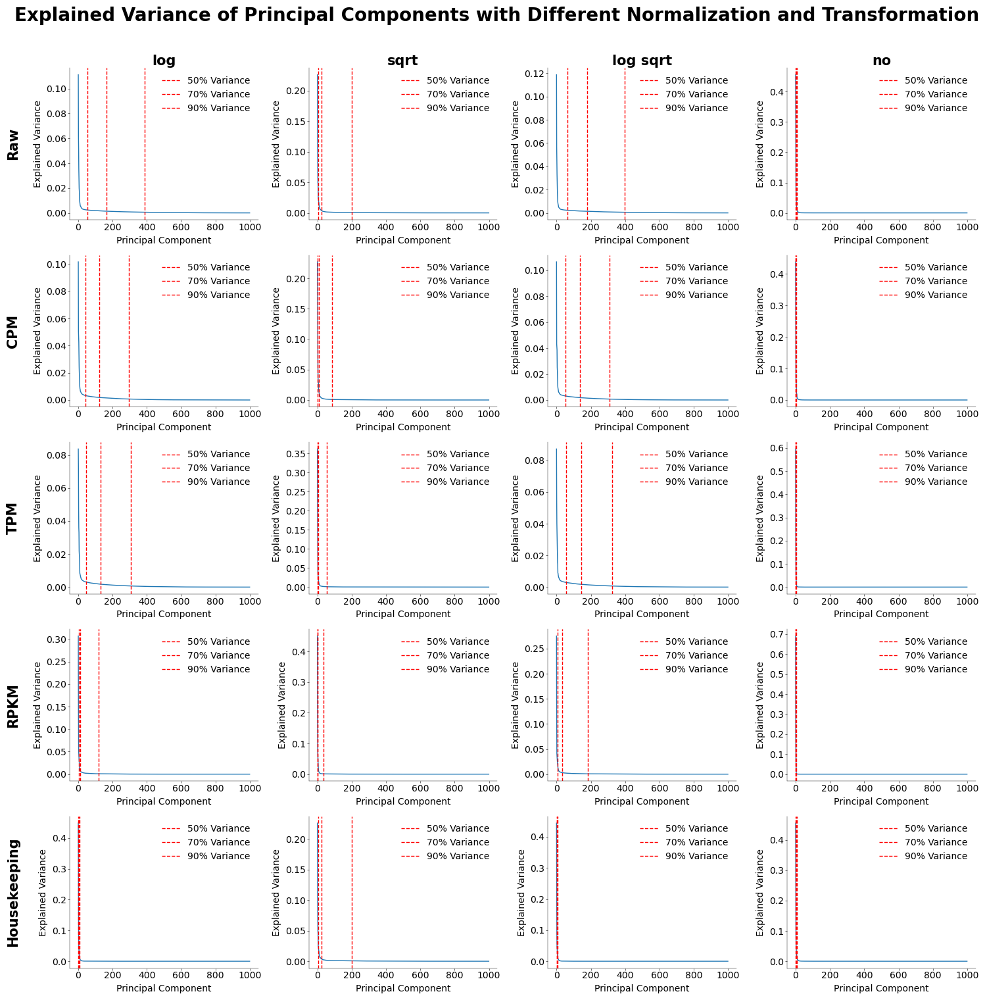

In [38]:
# get the 1000 highest fano factor genes from exoncounts
top_fano_factors, top_gene_expression = calculate_top_fano_factor_array(
    exonCounts[keepcells, :], top_genes=1000
)

norm_data_fano = {"Raw": top_gene_expression}

print(top_gene_expression.shape)
pca_results_fano = {}


for i, n_method in enumerate(norm_methods):
    norm_exonCounts = normalize_count_data(
        data_exons, data_genes=gene_data, method=n_method
    )
    top_fano_factors, top_gene_expression = calculate_top_fano_factor_array(
        norm_exonCounts, top_genes=1000
    )
    norm_data_fano[n_method] = top_gene_expression
    print("TGE:, ", top_gene_expression.shape)

    for j, t_method in enumerate(transform_methods):
        pca_norm, pca_norm_model = perform_pca(
            norm_data_fano[n_method][keepcells, :],
            transformation=t_method,
            standardize=False,
        )
        pca_results_fano[(n_method, transform_labels[j])] = pca_norm, pca_norm_model


# Create subplots with 2 rows and 3 columns
fig, axs = plt.subplots(5, 4, figsize=(30, 30))

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Iterate through the PCA results and plot the embeddings and explained variance
for i, (key, value) in enumerate(pca_results_fano.items()):
    norm_methods = ["Raw", "CPM", "TPM", "RPKM", "Housekeeping", "Total counts"]
    transformations = ["log", "sqrt", "log sqrt", "no"]
    # Plot PCA embedding
    plot_pca_embedding(
        value[0],
        labels=cluster_colors[keepcells],
        # title=f"PCA Embedding with {key[0]} Normalization and {key[1]} Transformation, explained variance: PC1: {value[1].explained_variance_ratio_[0]:.2f}, PC2: {value[1].explained_variance_ratio_[1]:.2f}",
        # keepcells=keepcells,
        ax=axs[i],
    )
    (
        axs[i].text(
            -0.2,
            0.5,
            norm_methods[int(i // 4)],
            transform=axs[i].transAxes,
            fontsize=15,
            rotation=90,
            va="center",
            ha="center",
            fontweight="bold",
        )
        if i % 4 == 0
        else None
    )
    (
        axs[i].set_title(
            transformations[i],
            fontweight="bold",
            fontsize=15,
        )
        if i < 4
        else None
    )
plt.suptitle(
    "PCA Embeddings with Different Normalization and Transformation Methods (Top 1000 Fano Factor Genes)",
    x=0.5,
    y=1.01,
    ha="center",
    fontsize=30,
    fontweight="bold",
)

plt.tight_layout()
plt.show()

fig, axs = plt.subplots(5, 4, figsize=(15, 15))
axs = axs.flatten()

# Iterate through the PCA results again and plot the explained variance
for i, (key, value) in enumerate(pca_results_fano.items()):
    explained_variance_ratio = value[1]
    cumulative_variance = np.cumsum(explained_variance_ratio)

    # Plot the explained variance of all the principal components
    axs[i].plot(explained_variance_ratio)  # , marker='o', label='Explained Variance')

    # Add vertical lines for 50%, 70%, and 90% cumulative variance
    for threshold in [0.5, 0.7, 0.9]:
        # Find the index where cumulative variance exceeds the threshold
        index = np.argmax(cumulative_variance >= threshold)
        axs[i].axvline(
            x=index,
            linestyle="--",
            color="r",
            label=f"{int(threshold * 100)}% Variance",
        )

    # axs[i].set_title(f"Explained Variance: {key[0]} Norm & {key[1]} Trans")
    axs[i].set_xlabel("Principal Component")
    axs[i].set_ylabel("Explained Variance")
    axs[i].legend()
    (
        axs[i].text(
            -0.3,
            0.5,
            norm_methods[i // 4],
            transform=axs[i].transAxes,
            fontsize=15,
            rotation=90,
            va="center",
            ha="center",
            fontweight="bold",
        )
        if i % 4 == 0
        else None
    )
    (
        axs[i].set_title(
            transformations[i],
            fontweight="bold",
            fontsize=15,
        )
        if i < 4
        else None
    )

# Adjust layout for better spacing
# set normalisation method as the column label

# set transformation method as the y-axis label
# set the title as the explained variance

plt.suptitle(
    "Explained Variance of Principal Components with Different Normalization and Transformation",
    x=0.5,
    y=1.01,
    ha="center",
    fontsize=20,
    fontweight="bold",
)

plt.tight_layout()
plt.show()

PCA embedding looks generally better. 
Like above, we can see that the most efficient PCA projection is achieved by the log (or lig sqrt) transformation on the Housekeeping normalized data. 

In [39]:
for key, value in pca_results.items():

    # print the number of pcas that explain 70% of the variance for each normalisation method
    print(
        f"Number of PCAs that explain 70% of the variance for {key[0]} Normalization and {key[1]} Transformation: {np.sum(np.cumsum(value[1]) < 0.7)}"
    )

# print the method with the min number of pc that explain 70% of the variance
min_pca = min(
    pca_results.items(),
    key=lambda x: np.sum(np.cumsum(x[1][1]) < 0.7),
)
print(
    f"Method with the min number of PCAs that explain 70% of the variance: {min_pca[0][0]} Normalization and {min_pca[0][1]} Transformation"
)

Number of PCAs that explain 70% of the variance for cpm Normalization and log Transformation: 568
Number of PCAs that explain 70% of the variance for cpm Normalization and sqrt Transformation: 454
Number of PCAs that explain 70% of the variance for cpm Normalization and log_sqrt Transformation: 571
Number of PCAs that explain 70% of the variance for cpm Normalization and no Transformation: 2
Number of PCAs that explain 70% of the variance for tpm Normalization and log Transformation: 549
Number of PCAs that explain 70% of the variance for tpm Normalization and sqrt Transformation: 335
Number of PCAs that explain 70% of the variance for tpm Normalization and log_sqrt Transformation: 559
Number of PCAs that explain 70% of the variance for tpm Normalization and no Transformation: 1
Number of PCAs that explain 70% of the variance for rpkm Normalization and log Transformation: 574
Number of PCAs that explain 70% of the variance for rpkm Normalization and sqrt Transformation: 263
Number of P

In [40]:
for key, value in pca_results_fano.items():

    # print the number of pcas that explain 70% of the variance for each normalisation method
    print(
        f"Number of PCAs that explain 70% of the variance for {key[0]} Normalization and {key[1]} Transformation: {np.sum(np.cumsum(value[1]) < 0.7)}"
    )

# print the method with the min number of pc that explain 70% of the variance
min_pca = min(
    pca_results_fano.items(),
    key=lambda x: np.sum(np.cumsum(x[1][1]) < 0.7),
)
print(
    f"Method with the min number of PCAs that explain 70% of the variance: {min_pca[0][0]} Normalization and {min_pca[0][1]} Transformation"
)

Number of PCAs that explain 70% of the variance for cpm Normalization and log Transformation: 166
Number of PCAs that explain 70% of the variance for cpm Normalization and sqrt Transformation: 24
Number of PCAs that explain 70% of the variance for cpm Normalization and log_sqrt Transformation: 178
Number of PCAs that explain 70% of the variance for cpm Normalization and no Transformation: 2
Number of PCAs that explain 70% of the variance for tpm Normalization and log Transformation: 124
Number of PCAs that explain 70% of the variance for tpm Normalization and sqrt Transformation: 8
Number of PCAs that explain 70% of the variance for tpm Normalization and log_sqrt Transformation: 138
Number of PCAs that explain 70% of the variance for tpm Normalization and no Transformation: 1
Number of PCAs that explain 70% of the variance for rpkm Normalization and log Transformation: 129
Number of PCAs that explain 70% of the variance for rpkm Normalization and sqrt Transformation: 4
Number of PCAs t

In [41]:
print(ephysData_filtered.shape)
print(exonCounts[keepcells, :].shape)

# print pca result keys
print(pca_results.keys())

# print the pca results ('housekeeping', 'no')
print(pca_results[("housekeeping", "no")][0].shape)

# check if the pca results contain nan values
print(np.sum(np.isnan(pca_results[("housekeeping", "no")][0])))

# get normalised exon counts with housekeeping method
print(norm_data.keys())
norm_exonCounts = norm_data["housekeeping"][keepcells, :]


norm_exonCounts_fano = norm_data_fano["housekeeping"][keepcells, :]
# normalize_count_data(data_exons, data_genes=gene_data, method="cpm")[
#     keepcells, :
# ]
# check if the normalised exon counts contain nan values
print(np.sum(np.isnan(norm_exonCounts)))

(1320, 17)
(1320, 42466)
dict_keys([('cpm', 'log'), ('cpm', 'sqrt'), ('cpm', 'log_sqrt'), ('cpm', 'no'), ('tpm', 'log'), ('tpm', 'sqrt'), ('tpm', 'log_sqrt'), ('tpm', 'no'), ('rpkm', 'log'), ('rpkm', 'sqrt'), ('rpkm', 'log_sqrt'), ('rpkm', 'no'), ('housekeeping', 'log'), ('housekeeping', 'sqrt'), ('housekeeping', 'log_sqrt'), ('housekeeping', 'no'), ('total_counts', 'log'), ('total_counts', 'sqrt'), ('total_counts', 'log_sqrt'), ('total_counts', 'no'), ('Raw', 'log'), ('Raw', 'sqrt'), ('Raw', 'log_sqrt'), ('Raw', 'no')])
(1320, 1320)
0
dict_keys(['Raw', 'cpm', 'tpm', 'rpkm', 'housekeeping', 'total_counts'])
0


We tried the hierarchical clustering on top 1000 genes (by Fano factor) after normalization. We obtain 3 major clusters. Globally the clustering does not correspond very well to originally identified t-types. Only on a very local scale some parts are recovered.

#### Gaussian mixture model clustering of the transcriptomic data

Optimal number of clusters: 5


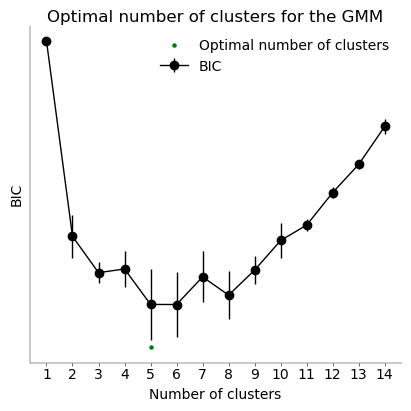

In [42]:
import warnings

# set the range of possible cluster number
possible_clusters = np.arange(1, 15, 1)
num_seeds = 10

best_pcs = pca_results_fano[("rpkm", "log")][0][:, 0:15]
# get the optimal cluster number using BIC
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    Transcriptomic_cluster_n = get_optimal_cluster_number(
        possible_clusters,
        num_seeds,
        best_pcs,
        bic_mode="sklearn",
        plot=True,
    )

    # fit the GMM model
    Transcriptomic_gmm = GMM(
        n_components=Transcriptomic_cluster_n, random_state=42
    ).fit(best_pcs)

# get the cluster labels, means and covariances
Trans_clusters = Transcriptomic_gmm.predict(best_pcs)
Trans_clusters_means = Transcriptomic_gmm.means_
Trans_clusters_covariances = Transcriptomic_gmm.covariances_

In [43]:
# get class labels
Transcriptomic_gmm_labels = Transcriptomic_gmm.predict(best_pcs)

In [44]:
reduced_data_rna = dim_reduction(norm_exonCounts, cluster_colors[keepcells])

PCA accuracy: 0.09
PCA recall: 0.09
NCA accuracy: 0.05
NCA recall: 0.05
LDA accuracy: 0.05
LDA recall: 0.05


### Negative binomial clustering

Our implementation of negative binomial mixture model only finds one cluster and is not clustering our data

LL -793303.1280832111
0:327, 1:357, 2:336, 3:309
LL -1746.936224947197
0:0, 1:1329, 2:0, 3:0


c:\Users\Arne.Gittel\Documents\Neuro Master\Neural data science\practicals\Final project\Final_Project\NDS_project\notebooks\Utils.py:729: RuntimeWarning: divide by zero encountered in log
  return np.log(p) + np.sum([x[:, g] * np.log(p_gk[:,g]) + r * np.log(1 - p_gk[:,g]) for g in S], axis=0)


LL -0.009992481026800327
0:0, 1:1329, 2:0, 3:0
cluster ID [1 1 1 ... 1 1 1]
means (4, 42466)
S: [19383 29494 17506 32947 42462    48 19239 16917 33627 33086 30959  8544
 33396 33394 16759 17672 18873 20356 18540 30923 18513 16771 41522 19952
  7889 33168 17100 32894 30900 32021 17740 15977 39179 20523 18579 17201
 32412 32165 16855  8338   467 16168 15984 15795 17127 17138 16052  1704
 33332 16041  1712  1464 11429 20522  6084 18010 16082 17606  7894 38656
 38655 31970 17699 17698 16018 17729  6536 19063  9727 30210 17263 16916
 16310  9836 31190 32608 19270 32542 20068  9982 28824 17307  4372 29660
 19591 33537  3079 18355 16151 15949 15799   622  3307  6782  3306 19671
 19077  8349 17627  1717]
p [0. 1. 0. 0.]


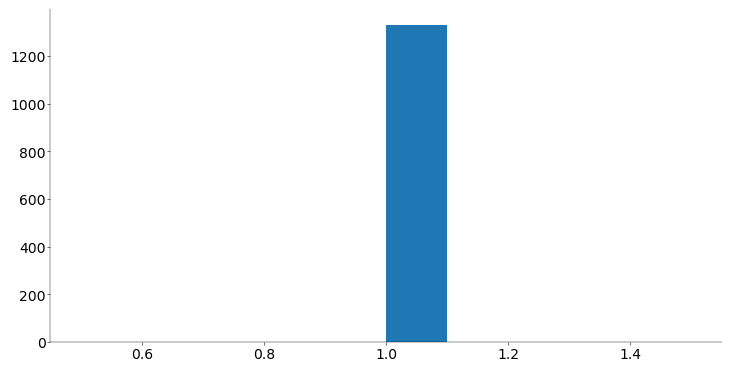

In [45]:
# negative binomial clustering

MM_cluster_ids_fit, MM_means_fit, S, p = NBMM(4).fit_nbmm(exonCounts)


print("cluster ID", MM_cluster_ids_fit)
print("means", MM_means_fit.shape)
print("S:", S)
print("p", p)

plt.figure()
plt.hist(MM_cluster_ids_fit)
plt.show()

In [46]:
print(Trans_clusters_means.shape)

(5, 15)


In [47]:
# performing t-SNE on the ePhys data
Transcriptomic_tsne = TSNE(
    init="pca", early_exaggeration=4, random_state=42
).fit_transform(best_pcs)

In [48]:
Transcriptomic_umap = umap.UMAP(random_state=42).fit_transform(best_pcs)

c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\4015354557.py:44: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax0.legend()
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\4015354557.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\4015354557.py:45: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


Text(0.5, 0.98, 'PCA and tSNE of Transcriptomic data with original labeling')

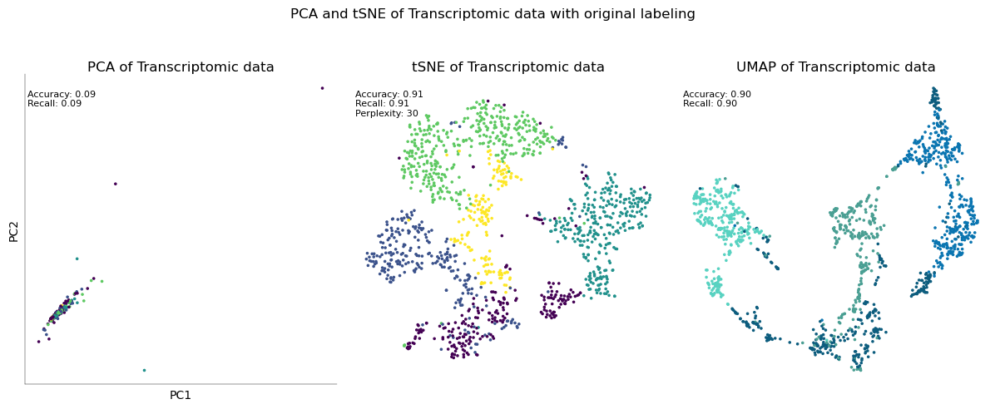

In [49]:
# pca_ePhys = pca_ePhys / np.std(pca_ePhys[:, 0]) * 0.0001

fig = plt.figure(figsize=(15, 8))

gs = GridSpec(2, 3, figure=fig, wspace=0.05, height_ratios=[2, 1])
# Create subplots with the specified gridspec
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
# ax3 = fig.add_subplot(gs[1, :])


plot_dim1_dim2(
    ax0,
    reduced_data_rna,
    Transcriptomic_gmm_labels,
    "PCA of Transcriptomic data",
    type="PCA",
    display_stats=True,
)
plot_TSNE(
    ax1,
    Transcriptomic_tsne,
    Transcriptomic_gmm_labels,
    "tSNE of Transcriptomic data",
    display_accuracy=True,
)
plot_umap(
    ax2,
    Transcriptomic_umap,
    cluster_colors[Transcriptomic_gmm_labels],
    "UMAP of Transcriptomic data",
    display_accuracy=True,
)
# plot_cell_types(neuron_groups, ax3, base_font_size=8)

# plot_ellipse(
#     Trans_clusters_means,
#     Trans_clusters_covariances,
#     ax=ax0,
#     color="black",
#     cluster_n=Transcriptomic_cluster_n,
# )
ax0.legend()
plt.tight_layout()
plt.suptitle("PCA and tSNE of Transcriptomic data with original labeling", fontsize=12)

#### Hierarchical clustering using pearson distance

(1320,) (1320, 1000)


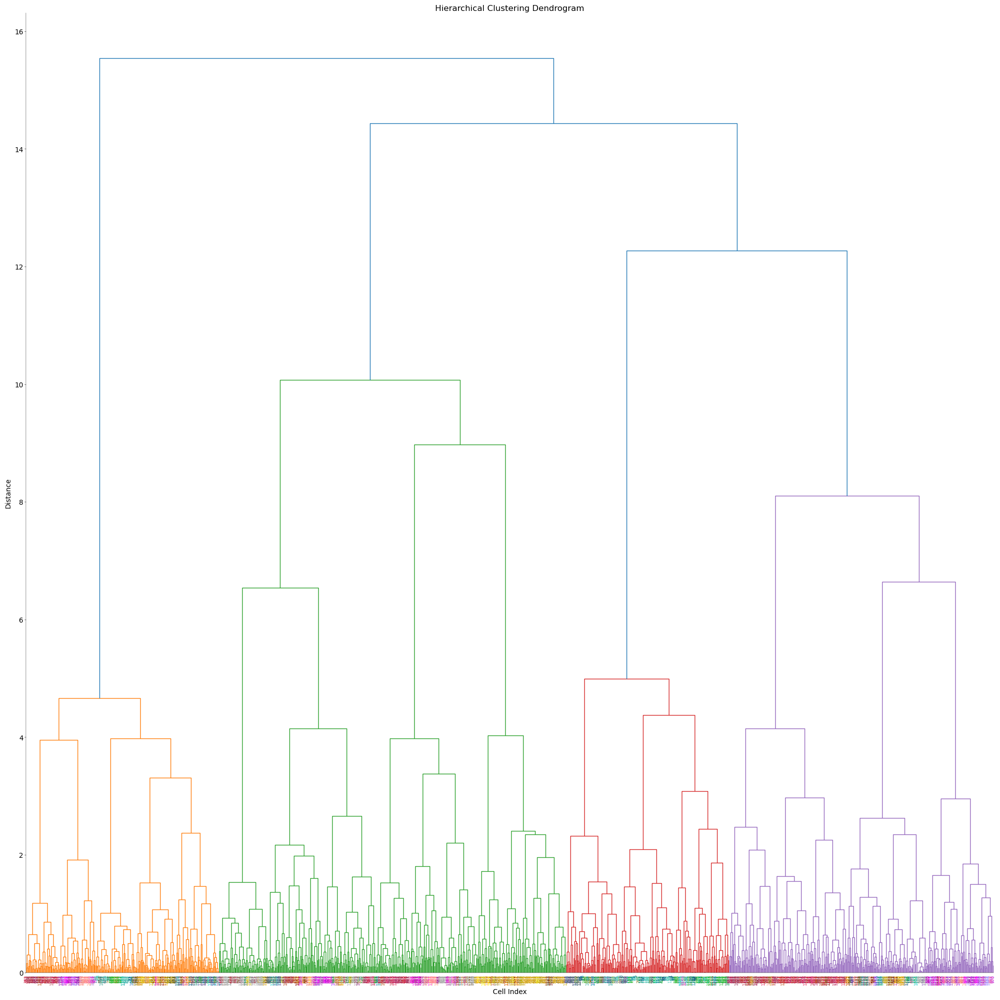

array([[1.36000000e+02, 1.73000000e+02, 3.50476973e-04, 2.00000000e+00],
       [7.40000000e+01, 9.80000000e+01, 1.85561387e-03, 2.00000000e+00],
       [1.57000000e+02, 1.65000000e+02, 2.27689761e-03, 2.00000000e+00],
       ...,
       [2.63000000e+03, 2.63300000e+03, 1.22683856e+01, 5.83000000e+02],
       [2.63500000e+03, 2.63600000e+03, 1.44359901e+01, 1.05700000e+03],
       [2.62900000e+03, 2.63700000e+03, 1.55387420e+01, 1.32000000e+03]])

In [50]:
import numpy as np
import scipy.cluster.hierarchy as sch
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform


def pearson_distance(X):
    """
    Compute the Pearson distance matrix for a given array.

    Parameters:
    - X (np.ndarray): A 2D array with shape (cells, genes).

    Returns:
    - dist (np.ndarray): The Pearson distance matrix.
    """
    # Compute the correlation matrix
    corr = np.corrcoef(X)

    # Convert correlation to distance
    dist = 1 - corr

    # Ensure the distance matrix is condensed as required by scipy linkage
    return squareform(dist, checks=False)


def hierarchical_clustering(rna_seq_array, cluster_colors, method="ward", plot=True):
    """
    Perform hierarchical clustering on cells based on gene counts using Pearson distance.

    Parameters:
    - rna_seq_array (np.ndarray): A 2D array with shape (cells, genes).
    - cluster_colors (list or np.ndarray): Array of colors corresponding to each sample.
    - method (str): Linkage method to use for clustering (default is 'ward').
    - plot (bool): If True, plot the dendrogram (default is True).

    Returns:
    - linkage_matrix (np.ndarray): The linkage matrix containing the hierarchical clustering.
    """

    # Calculate the Pearson distance matrix
    distance_matrix = pearson_distance(rna_seq_array)

    # Perform hierarchical/agglomerative clustering
    linkage_matrix = sch.linkage(distance_matrix, method=method)

    if plot:
        # Plot the dendrogram
        plt.figure(figsize=(20, 20))
        dendro = sch.dendrogram(
            linkage_matrix,
            labels=np.arange(len(rna_seq_array)),
            leaf_rotation=90,
            leaf_font_size=8,
        )

        # Apply the colors to the labels
        ax = plt.gca()
        x_labels = ax.get_xmajorticklabels()
        for lbl in x_labels:
            lbl.set_color(cluster_colors[int(lbl.get_text())])
            lbl.set_fontsize(6)

        plt.title("Hierarchical Clustering Dendrogram")
        plt.xlabel("Cell Index")
        plt.ylabel("Distance")
        plt.show()

    return linkage_matrix


# Example usage with your data and cluster_colors array:
# hierarchical_clustering(norm_exonCounts_fano, cluster_colors)

print(cluster_colors[keepcells].shape, norm_exonCounts_fano.shape)
hierarchical_clustering(best_pcs, cluster_colors=cluster_colors[keepcells])

The GMM yields 4 to 5 clusters when performed on the PCA-processed transcriptomic data. This is concordant with the hierarchical clustering performed above. However obtained clusters do not match well original clusters as presented in the paper.

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\1495139830.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


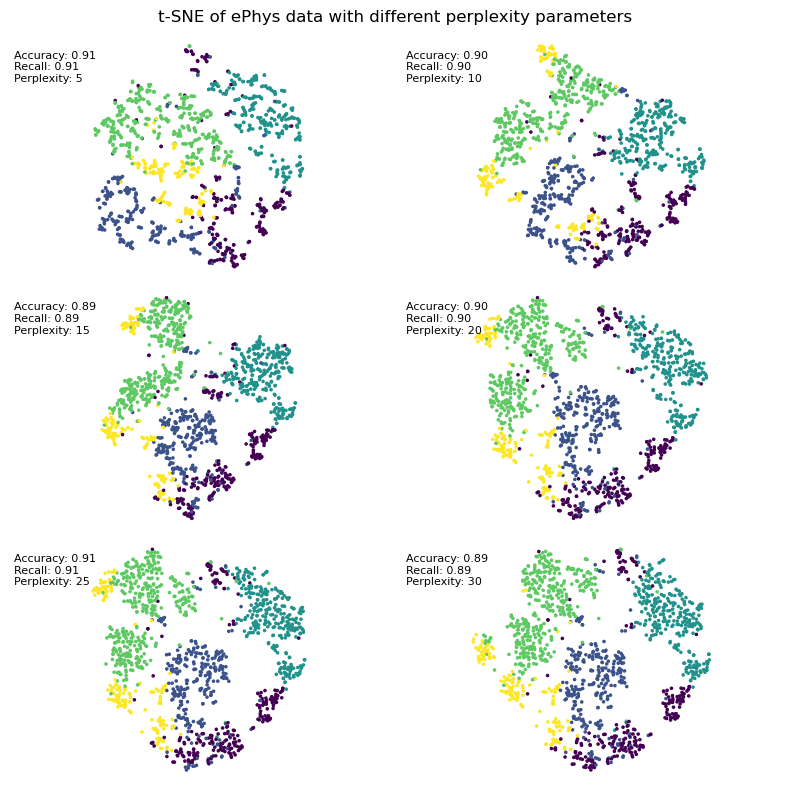

In [51]:
# Initialize list to store t-SNE results
TSNES = []

# Define range of perplexity values to test
perplexities = np.arange(5, 35, 5)

# Calculate number of rows and columns for subplots grid
num_plots = len(perplexities)
ncols = 2
nrows = (num_plots + ncols - 1) // ncols  # Ensure enough rows for the number of plots

# Set up subplots grid
fig, axs = plt.subplots(nrows, ncols, figsize=(8, 8))

# Flatten the axs array if it's 2D
if nrows * ncols > 1:
    axs = axs.flatten()

# Loop through perplexity values and perform t-SNE
for i, p in enumerate(perplexities):
    tsne = TSNE(perplexity=p, random_state=42).fit_transform(best_pcs)
    TSNES.append(tsne)
    ax = axs[i]
    plot_TSNE(
        ax,
        tsne,
        Transcriptomic_gmm_labels,
        title="",
        display_accuracy=True,
        perplexity=p,
    )

# Remove any empty subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Show the plot

plt.suptitle("t-SNE of ePhys data with different perplexity parameters", fontsize=12)
plt.tight_layout()

Here we run TSNE-embeddings with different perplexity parameters and assess accuracy with the help of k-nearest neighbors. The figure shows that according to the k-nearest neighbors classification, TSNE with the perplexity parameter 25 has the highest accuracy. This is also the default parameter, which was used in other plots in this study

### K-nearest neigbhors clustering and Leiden graph visualization

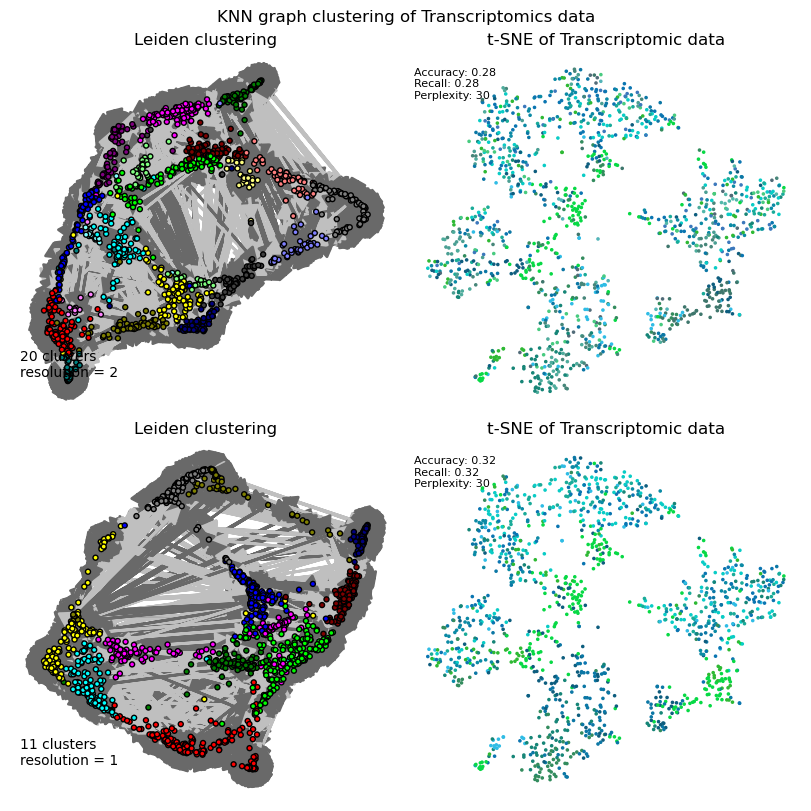

In [52]:
import igraph as ig
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import leidenalg as la


clusterCols = np.unique(cluster_colors)


A = kneighbors_graph(norm_exonCounts, 10, mode="connectivity", include_self=False)
sources, targets = A.nonzero()
G = ig.Graph(directed=True)
G.add_vertices(A.shape[0])
edges = list(zip(sources, targets))
G.add_edges(edges)

resolutions = [2, 1]

fig, ax = plt.subplots(2, 2, figsize=(8, 8))
for i in range(2):
    partition = la.find_partition(
        G,
        la.RBConfigurationVertexPartition,
        resolution_parameter=resolutions[i],
        seed=42,
    )

    ig.plot(
        partition,
        vertex_size=5,
        edge_curved=False,
        edgecolor="black",
        colors=clusterCols[partition.membership],
        target=ax[i][0],
        alpha=0.5,
    )
    ax[i][0].set_title("Leiden clustering")
    ax[i][0].text(
        0.025,
        0.1,
        f"{len(np.unique(partition.membership))} clusters\nresolution = {resolutions[i]}",
        transform=ax[i][0].transAxes,
    )

    plot_TSNE(
        ax[i][1],
        Transcriptomic_tsne,
        clusterCols[partition.membership],
        "t-SNE of Transcriptomic data",
        display_accuracy=True,
    )
    plt.suptitle("KNN graph clustering of Transcriptomics data")

Leiden clustering finds 20 or 11 clusters depending on the resolution parameter. 

### Data analysis and visualisation 


Excitatory cells data shape: (42466, 275)
Inhibitory cells data shape: (42466, 371)
Excitatory cells with all zero values: Index([], dtype='object')
Excitatory cells with all NaN values: Index([], dtype='object')
Inhibitory cells with all zero values: Index([], dtype='object')
Inhibitory cells with all NaN values: Index([], dtype='object')
P-values contain NaNs or Infs.
Number of NaNs in p-values: 2235
Number of Infs in p-values: 0
                        Gene    t_stat     p_val  mean_expression_excitatory  \
GeneID                                                                         
0610005C13Rik  0610005C13Rik  0.754662  0.450728                    1.025455   
0610006L08Rik  0610006L08Rik  1.161819  0.245740                    0.047273   
0610009B22Rik  0610009B22Rik  0.967456  0.333679                   46.985455   
0610009E02Rik  0610009E02Rik  1.444250  0.149155                    2.992727   
0610009L18Rik  0610009L18Rik  2.069276  0.038919                    9.825455   

   

c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


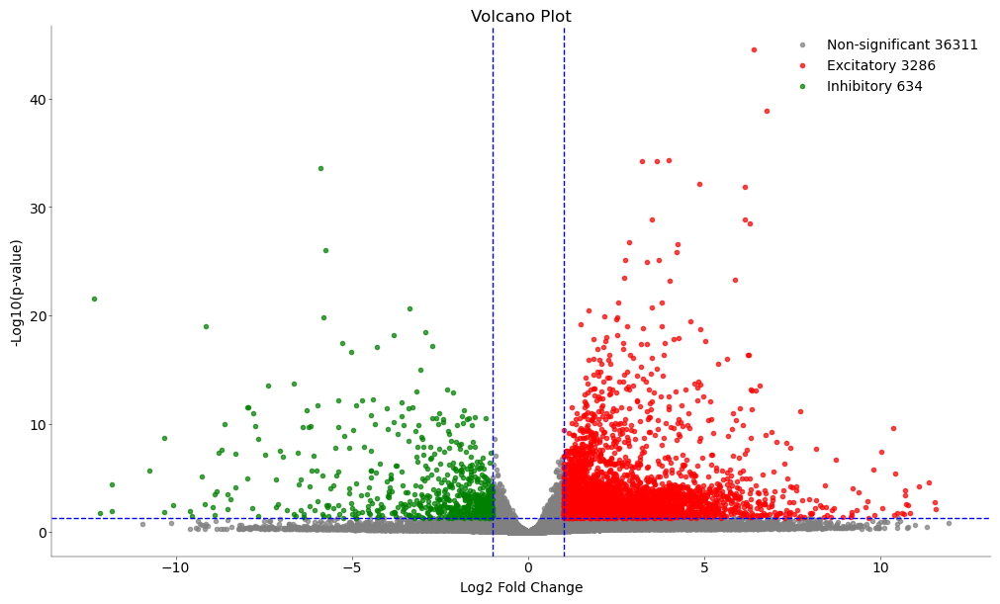

In [53]:
# Load morphology data
morphologyData = pd.read_csv(data_path / "m1_patchseq_morph_features.csv")

data_exons.rename_axis("GeneID", axis="index", inplace=True)

# # Ensure 'GeneID' is in the columns or index of data_exons
# if "GeneID" in data_exons.columns:
#     data_exons.set_index("GeneID", inplace=True)
# elif "GeneID" in data_exons.index.names:
#     pass
# else:
#     raise KeyError(
#         "'GeneID' not found in the index or columns of the gene expression dataframe."
#     )

# Filter gene expression dataframe to include only cells present in the morphological dataframe
cells_with_morph_data = morphologyData["cell id"].unique()
df_genes_filtered = data_exons.loc[:, cells_with_morph_data]

# Split based on cell class
df_morph = morphologyData.set_index("cell id")
cell_classes = df_morph.loc[cells_with_morph_data, "cell class"]
excitatory_cells = cell_classes[cell_classes == "exc"].index
inhibitory_cells = cell_classes[cell_classes == "inh"].index

df_genes_excitatory = df_genes_filtered[excitatory_cells]
df_genes_inhibitory = df_genes_filtered[inhibitory_cells]

# Print shapes
print("Excitatory cells data shape:", df_genes_excitatory.shape)
print("Inhibitory cells data shape:", df_genes_inhibitory.shape)

# Calculate mean gene expression for each gene in each cell class
mean_gene_expression_excitatory = df_genes_excitatory.mean(axis=1)
mean_gene_expression_inhibitory = df_genes_inhibitory.mean(axis=1)

# Drop NA values
df_genes_excitatory = df_genes_excitatory.dropna()
df_genes_inhibitory = df_genes_inhibitory.dropna()

# Check for zero and NaN values
zero_values_excitatory = df_genes_excitatory.columns[(df_genes_excitatory == 0).all()]
nan_values_excitatory = df_genes_excitatory.columns[df_genes_excitatory.isnull().all()]
zero_values_inhibitory = df_genes_inhibitory.columns[(df_genes_inhibitory == 0).all()]
nan_values_inhibitory = df_genes_inhibitory.columns[df_genes_inhibitory.isnull().all()]

print("Excitatory cells with all zero values:", zero_values_excitatory)
print("Excitatory cells with all NaN values:", nan_values_excitatory)
print("Inhibitory cells with all zero values:", zero_values_inhibitory)
print("Inhibitory cells with all NaN values:", nan_values_inhibitory)

# Perform unpaired t-test for each gene
t_stat, p_val = ttest_ind(df_genes_excitatory.T, df_genes_inhibitory.T, axis=0)

# Check for NaNs or Infs in p-values
if np.any(np.isnan(p_val)) or np.any(np.isinf(p_val)):
    print("P-values contain NaNs or Infs.")
    print("Number of NaNs in p-values:", np.sum(np.isnan(p_val)))
    print("Number of Infs in p-values:", np.sum(np.isinf(p_val)))


# Create a dataframe for the t-test results
t_test_results = pd.DataFrame(
    {
        "Gene": df_genes_filtered.index,
        "t_stat": t_stat,
        "p_val": p_val,
        "mean_expression_excitatory": mean_gene_expression_excitatory,
        "mean_expression_inhibitory": mean_gene_expression_inhibitory,
    }
)

# select all t_test results with p-value == NaN
nan_p_values = t_test_results[t_test_results["p_val"].isna()]
# print(nan_p_values)

# delete all rows with p-value  == NaN
t_test_results = t_test_results.dropna(subset=["p_val"])


# Correct for multiple testing on p-values from t_test_result df using Benjamini-Hochberg method
_, pvals_corrected, _, _ = multipletests(t_test_results["p_val"], method="fdr_bh")

# Add corrected p-values to the t_test_results dataframe for the correct genes
t_test_results["p_val_corrected"] = pvals_corrected

# Print the first few rows of the t_test_results dataframe
print(t_test_results.head())
print(t_test_results.shape)

# print minimal p value
min_p_val = t_test_results["p_val"].min()
min_p_val_idx = t_test_results["p_val"].idxmin()
min_p_val_gene = t_test_results.loc[min_p_val_idx, "Gene"]

print(f"Minimal p-value: {min_p_val} for gene {min_p_val_gene}")

# print minimal corrected p value
min_p_val_corrected = t_test_results["p_val_corrected"].min()
min_p_val_corrected_idx = t_test_results["p_val_corrected"].idxmin()
min_p_val_corrected_gene = t_test_results.loc[min_p_val_corrected_idx, "Gene"]

print(
    f"Minimal corrected p-value: {min_p_val_corrected} for gene {min_p_val_corrected_gene}"
)


t_test_results.set_index("Gene", inplace=True)

# Ensure fold change is calculated correctly
t_test_results["fold_change"] = np.log2(
    t_test_results["mean_expression_excitatory"]
    / t_test_results["mean_expression_inhibitory"]
)

# Thresholds
fold_change_threshold = 1
p_val_threshold = 0.05

# Identify significant genes for excitatory and inhibitory cells
significant_genes_excitatory = t_test_results[
    (t_test_results["fold_change"] > fold_change_threshold)
    & (t_test_results["p_val_corrected"] < p_val_threshold)
]

significant_genes_inhibitory = t_test_results[
    (t_test_results["fold_change"] < -fold_change_threshold)
    & (t_test_results["p_val_corrected"] < p_val_threshold)
]

# Print the number of significant genes
print(
    "Number of significant genes (excitatory):", significant_genes_excitatory.shape[0]
)
print(
    "Number of significant genes (inhibitory):", significant_genes_inhibitory.shape[0]
)

# Plot the volcano plot
plt.figure(figsize=(10, 6))

# Plot non-significant genes
plt.scatter(
    t_test_results.loc[
        ~t_test_results.index.isin(significant_genes_excitatory.index)
        & ~t_test_results.index.isin(significant_genes_inhibitory.index),
        "fold_change",
    ],
    -np.log10(
        t_test_results.loc[
            ~t_test_results.index.isin(significant_genes_excitatory.index)
            & ~t_test_results.index.isin(significant_genes_inhibitory.index),
            "p_val_corrected",
        ]
    ),
    color="grey",
    alpha=0.7,
    label=f"Non-significant {t_test_results.shape[0] - significant_genes_excitatory.shape[0] - significant_genes_inhibitory.shape[0]}",
)

# Highlight significant genes (excitatory)
plt.scatter(
    significant_genes_excitatory["fold_change"],
    -np.log10(significant_genes_excitatory["p_val_corrected"]),
    color="red",
    alpha=0.7,
    label=f"Excitatory {significant_genes_excitatory.shape[0]}",
)

# Highlight significant genes (inhibitory)
plt.scatter(
    significant_genes_inhibitory["fold_change"],
    -np.log10(significant_genes_inhibitory["p_val_corrected"]),
    color="green",
    alpha=0.7,
    label=f"Inhibitory {significant_genes_inhibitory.shape[0]}",
)
# mark the top 10 genes with the highest significance and fold change
top_genes_excitatory = significant_genes_excitatory.nlargest(10, "fold_change")
top_genes_inhibitory = significant_genes_inhibitory.nsmallest(10, "fold_change")


# Adding labels and title
plt.xlabel("Log2 Fold Change")
plt.ylabel("-Log10(p-value)")
plt.title("Volcano Plot")

# Adding threshold lines
plt.axhline(y=-np.log10(p_val_threshold), color="blue", linestyle="--")
plt.axvline(x=-fold_change_threshold, color="blue", linestyle="--")
plt.axvline(x=fold_change_threshold, color="blue", linestyle="--")

plt.legend()
plt.show()


# mark the top 10 genes with the highest significance and fold change
top_genes_excitatory = significant_genes_excitatory.nlargest(10, "fold_change")
top_genes_inhibitory = significant_genes_inhibitory.nsmallest(10, "fold_change")

Here we scan for the fraction of significantly active genes with significant fold change in mRNA in Excitatory (red) and Inhibitory (green cells) assessed by multiple testing correections using Benjamini - Hochberg method

In [54]:
# create a list of the gene names of the significant genes for excitatory cells
significant_genes_excitatory_list = significant_genes_excitatory.index.tolist()
print(significant_genes_excitatory_list)
# create a list of the gene names of the significant genes for inhibitory cells
significant_genes_inhibitory_list = significant_genes_inhibitory.index.tolist()

['1110002E22Rik', '1110008P14Rik', '1110018N20Rik', '1110032F04Rik', '1600010M07Rik', '1700001K23Rik', '1700001L19Rik', '1700003D09Rik', '1700007F19Rik', '1700016K19Rik', '1700019D03Rik', '1700021N21Rik', '1700022I11Rik', '1700047F07Rik', '1700047G03Rik', '1700066M21Rik', '1700101I11Rik', '1700105P06Rik', '1700110K17Rik', '1810037I17Rik', '2010109A12Rik', '2010300C02Rik', '2310075C17Rik', '2410017I17Rik', '2410018L13Rik', '2600014E21Rik', '2610306M01Rik', '2810029C07Rik', '2810433D01Rik', '2810455O05Rik', '2810468N07Rik', '2900026A02Rik', '2900060B14Rik', '2900079G21Rik', '3110082I17Rik', '4833412C05Rik', '4921511C10Rik', '4921524J17Rik', '4921539H07Rik', '4930419G24Rik', '4930426L09Rik', '4930447C04Rik', '4930447M23Rik', '4930449C09Rik', '4930455M05Rik', '4930480K15Rik', '4930483P17Rik', '4930518C09Rik', '4930533N22Rik', '4930556I23Rik', '4930578G10Rik', '4930590L20Rik', '4930599N23Rik', '4932441J04Rik', '4933412E12Rik', '4933421D24Rik', '4933425L06Rik', '4933427G23Rik', '4933432I09Ri

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\1445115026.py:97: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


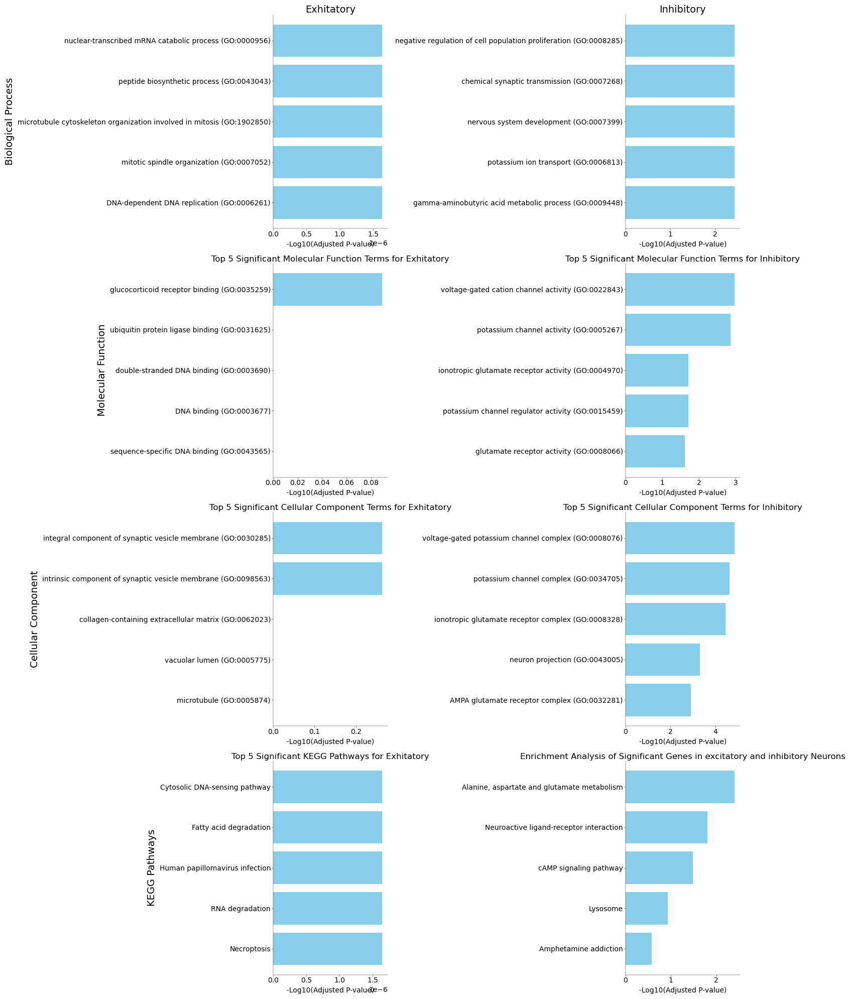

In [55]:
import gseapy as gp


# Function to plot the top 5 significant results
def plot_top5(ax, data, title):
    # Sort the data and get the top 5 results
    top5 = data.sort_values(by="Adjusted P-value").head(5)

    # Create the bar plot on the provided ax
    ax.barh(top5["Term"], -np.log10(top5["Adjusted P-value"]), color="skyblue")
    ax.set_xlabel("-Log10(Adjusted P-value)")
    ax.set_title(title)
    ax.invert_yaxis()

    return ax


# Create a subplot with 2 columns and 4 rows
fig, axs = plt.subplots(4, 2, figsize=(15, 20))

# Define criteria and labels
criteria = ["Exhitatory", "Inhibitory"]
analysis_types = [
    "Biological Process",
    "Molecular Function",
    "Cellular Component",
    "KEGG Pathways",
]

# Define your gene lists
gene_lists = [significant_genes_excitatory_list, significant_genes_inhibitory_list]

for i, gene_list in enumerate(gene_lists):
    # Perform enrichment analysis for Biological Process
    enr_bp = gp.enrichr(
        gene_list=gene_list,
        gene_sets="GO_Biological_Process_2021",
        organism="Mouse",  # Change to 'human' if your genes are human
        outdir=None,  # Set to a path if you want to save results to files
    )

    # Perform enrichment analysis for Molecular Function
    enr_mf = gp.enrichr(
        gene_list=gene_list,
        gene_sets="GO_Molecular_Function_2021",
        organism="Mouse",
        outdir=None,
    )

    # Perform enrichment analysis for Cellular Component
    enr_cc = gp.enrichr(
        gene_list=gene_list,
        gene_sets="GO_Cellular_Component_2021",
        organism="Mouse",
        outdir=None,
    )

    # Perform enrichment analysis for KEGG Pathways
    enr_kegg = gp.enrichr(
        gene_list=gene_list,
        gene_sets="KEGG_2019_Mouse",
        organism="Mouse",
        outdir=None,
    )

    # Assign each subplot to the appropriate analysis
    plot_top5(
        axs[0, i],
        enr_bp.results,
        f"Top 5 Significant Biological Process Terms for {criteria[i]}",
    )
    plot_top5(
        axs[1, i],
        enr_mf.results,
        f"Top 5 Significant Molecular Function Terms for {criteria[i]}",
    )
    plot_top5(
        axs[2, i],
        enr_cc.results,
        f"Top 5 Significant Cellular Component Terms for {criteria[i]}",
    )
    plot_top5(
        axs[3, i],
        enr_kegg.results,
        f"Top 5 Significant KEGG Pathways for {criteria[i]}",
    )

# Add column labels
for ax, criterion in zip(axs[0], criteria):
    ax.set_title(criterion, fontsize=14)

# Add row labels
for ax, analysis_type in zip(axs[:, 0], analysis_types):
    ax.set_ylabel(analysis_type, fontsize=14)

# Adjust layout
plt.tight_layout()
plt.title(
    "Enrichment Analysis of Significant Genes in excitatory and inhibitory Neurons"
)
plt.show()

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\436738076.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


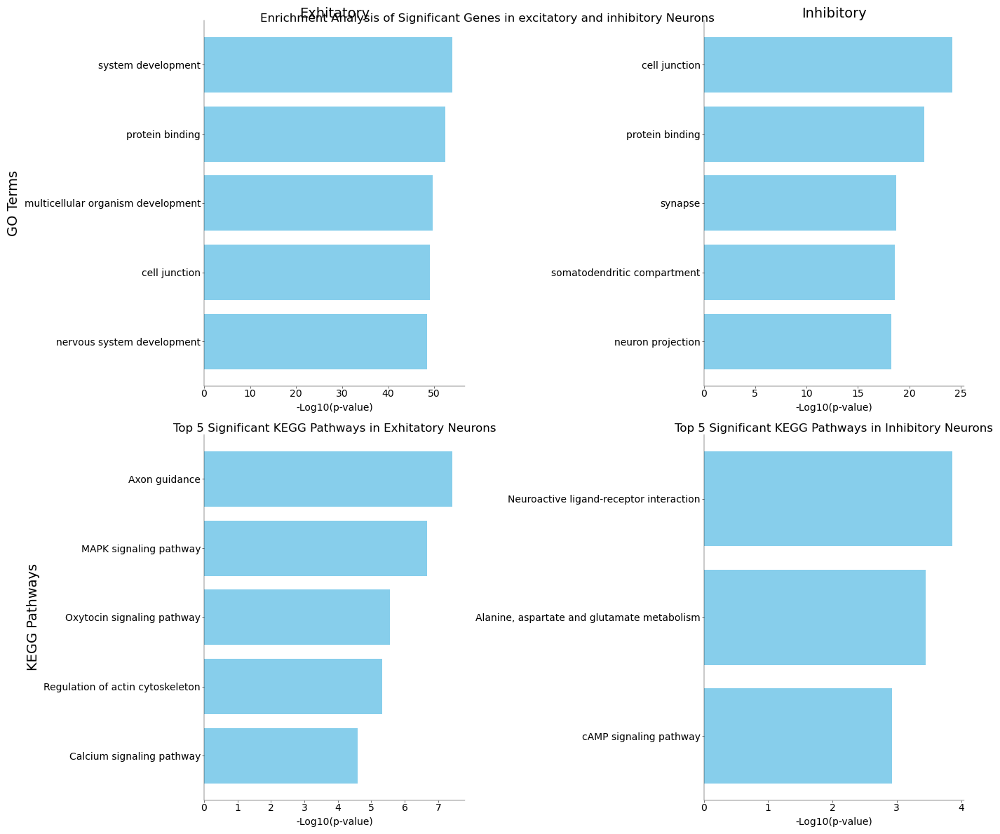

In [56]:
from gprofiler import GProfiler


# Function to plot horizontal bar chart
def plot_horizontal_bar(ax, data, title):
    # Sort the data and get the top 5 results
    top5 = data.sort_values(by="p_value").head(5)

    # Create the bar plot on the provided ax
    ax.barh(top5["name"], -np.log10(top5["p_value"]), color="skyblue")
    ax.set_xlabel("-Log10(p-value)")
    ax.set_title(title)
    ax.invert_yaxis()


# Initialize the GProfiler object
gp = GProfiler(return_dataframe=True)

# Create a subplot with 2 columns and 2 rows
fig, axs = plt.subplots(2, 2, figsize=(14, 12))

criteria = ["Exhitatory", "Inhibitory"]
for i, genes in enumerate(
    [significant_genes_excitatory_list, significant_genes_inhibitory_list]
):
    # Perform the enrichment analysis
    results = gp.profile(organism="mmusculus", query=genes)

    # Filter results to include only GO terms
    go_results = results[results["source"].str.contains("GO")]

    # Filter results to include only KEGG pathways
    kegg_results = results[results["source"].str.contains("KEGG")]

    # Apply multiple testing correction threshold (e.g., FDR < 0.05)
    significant_go_results = go_results[go_results["p_value"] < 0.05]
    significant_kegg_results = kegg_results[kegg_results["p_value"] < 0.05]

    # Sort the results by p-value to get the most significant results
    sorted_go_results = significant_go_results.sort_values(by="p_value").head(5)
    sorted_kegg_results = significant_kegg_results.sort_values(by="p_value").head(5)

    # Plot top 5 significant GO terms
    plot_horizontal_bar(
        axs[0, i],
        sorted_go_results,
        f"Top 5 Significant GO Terms in {criteria[i]} Neurons",
    )

    # Plot top 5 significant KEGG pathways
    plot_horizontal_bar(
        axs[1, i],
        sorted_kegg_results,
        f"Top 5 Significant KEGG Pathways in {criteria[i]} Neurons",
    )

# Add column labels
for ax, criterion in zip(axs[0], criteria):
    ax.set_title(criterion, fontsize=14)

# Add row labels
axs[0, 0].set_ylabel("GO Terms", fontsize=14)
axs[1, 0].set_ylabel("KEGG Pathways", fontsize=14)

# Adjust layout
plt.tight_layout()
plt.suptitle(
    "Enrichment Analysis of Significant Genes in excitatory and inhibitory Neurons"
)
plt.show()

### Compile the cell types pandas dataframe

In [57]:
# stack depth array and rna type array
depth_keep = depth[keepcells]
# rna_type_keep = rna_type[keepcells]
thickness_keep = thickness[keepcells]
# normalize depth via thickness
depth_keep = depth_keep / thickness_keep
# print min and max of depth
print(np.nanmin(depth_keep))
print(np.nanmax(depth_keep))

# normalize depth
depth_keep = (depth_keep - np.nanmin(depth_keep)) / (
    np.nanmax(depth_keep) - np.nanmin(depth_keep)
)

print(depth_keep.shape)
print(rna_type_keep.shape)

# Create a DataFrame for the cell types and depths
df_depth_per_type = pd.DataFrame({"rna_type": rna_type_keep, "depth": depth_keep})

print(df_depth_per_type.head())

0.030842794478131853
0.9805202018837277
(1320,)
(1320,)
  rna_type     depth
0  L5 ET_1  0.492092
1  L5 IT_2  0.475048
2  L5 IT_1  0.442118
3  L5 ET_4  0.402793
4  L5 ET_1  0.585180


#### Plotting function for cell types and classes

In [58]:
def plot_cell_types(
    groups: list,
    ax: plt.Axes,
    base_font_size: int = 8,
    df_depth_per_type=pd.DataFrame({"rna_type": rna_type, "depth": depth}),
) -> None:
    """
    Plot cell types of the mapping database

    Parameters
    ----------

    groups: list
        List of groups to plot

    ax: plt.Axes
        Axis to plot on

    base_font_size: int
        Base font size for plotting

    Return
    ------
    None

    """
    global mapping_db
    x_base = 0
    xticks = []
    xticklabels = []

    max_height = max(mapping_db["count"])

    figsize = ax.get_figure().get_size_inches()
    width_factor = figsize[0] / 15
    height_factor = figsize[1] / 5
    font_size = calculate_font_size(base_font_size, min(width_factor, height_factor))

    for i, group in enumerate(groups):
        group_data = mapping_db[mapping_db["type"] == group]
        print(group_data.shape)
        x_positions = np.arange(len(group_data)) + x_base

        ax.bar(x_positions, group_data["count"], color=group_data["color"], width=0.8)

        ax.text(
            x_base + (len(group_data) - 1) / 2,
            max_height - 10,
            group,
            ha="center",
            va="bottom",
            fontsize=font_size * 1.2,
            fontweight="bold",
        )

        xticks.extend(x_positions)
        xticklabels.extend(group_data["cell_types"])

        x_base += len(group_data) + 1  # Increment x_base for next group

    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, rotation=90, fontsize=font_size)
    # (L1, 0.07; L2/3, 0.29; L5, 0.73)
    ax.set_ylabel("Count")

In [59]:
def plot_cell_types_depth(
    groups: list,
    base_font_size: int = 10,  # Manually set base font size
    figsize: tuple = (15, 10),  # Manually set figure size
    df_depth_per_type=pd.DataFrame({"rna_type": rna_type, "depth": depth}),
) -> None:
    """
    Plot cell types of the mapping database and violin plot of depths

    Parameters
    ----------
    groups: list
        List of groups to plot
    base_font_size: int
        Base font size for plotting
    df_depth_per_type: pd.DataFrame
        DataFrame containing the depth information for each cell type

    Return
    ------
    None
    """
    global mapping_db

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, sharex=True)

    x_base = 0
    xticks = []
    xticklabels = []
    colors = []

    max_height = max(mapping_db["count"])

    for i, group in enumerate(groups):
        group_data = mapping_db[mapping_db["type"] == group]
        x_positions = np.arange(len(group_data)) + x_base

        bars = ax1.bar(
            x_positions, group_data["count"], color=group_data["color"], width=0.8
        )

        # Collect colors to use in violin plot
        colors.extend([bar.get_facecolor() for bar in bars])

        ax1.text(
            x_base + (len(group_data) - 1) / 2,
            max_height - 10,
            group,
            ha="center",
            va="bottom",
            fontsize=base_font_size * 1.2,
            fontweight="bold",
        )

        xticks.extend(x_positions)
        xticklabels.extend(group_data["cell_types"])

        x_base += len(group_data) + 1  # Increment x_base for next group

    ax1.set_xticks(xticks)
    ax1.set_xticklabels(xticklabels, rotation=90, fontsize=base_font_size)
    ax1.set_ylabel("Count", fontsize=base_font_size)

    # Prepare data for the violin plot
    violin_data = df_depth_per_type[df_depth_per_type["rna_type"].isin(xticklabels)]
    sns.violinplot(
        x="rna_type",
        y="depth",
        data=violin_data,
        ax=ax2,
        order=xticklabels,
        palette=colors,
        alpha=0.5,
    )

    ax2.set_xlabel("Cell Types", fontsize=base_font_size)
    ax2.set_ylabel("Depth", fontsize=base_font_size)
    ax2.set_xticklabels(xticklabels, rotation=90, fontsize=base_font_size)
    ax2.set_ylim(0, 1)

    # Add horizontal lines and labels
    horizontal_lines = {"L1": 0.07, "L2/3": 0.29, "L5": 0.73}

    # add y ticks for the horizontal lines
    for label, y in horizontal_lines.items():
        ax2.axhline(y=y, color="grey", linestyle="--")
        ax2.text(
            len(xticklabels) + 0.5,
            y,
            label,
            color="grey",
            va="center",
            fontsize=base_font_size,
        )

    for label, y in horizontal_lines.items():
        ax2.axhline(y=y, color="grey", linestyle="--")
        ax2.text(
            len(xticklabels) + 0.5,
            y,
            label,
            color="grey",
            va="center",
            fontsize=base_font_size,
        )

    plt.tight_layout()
    plt.show()

## Analisys of ePhys Data

In [60]:
# Use knn_classification to classify the original data

Data = ephysData_filtered
labels = cluster_colors[keepcells]
print(cluster_colors[keepcells].shape)
# print(np.unique(cluster_colors[keepcells]))
accuracy, recall = knn_classification(Data, labels)
print(f"Original data label accuracy: {accuracy:.2f}")
print(f"Original data label recall: {recall:.2f}")

(1320,)
Original data label accuracy: 0.34
Original data label recall: 0.34


### Exploring and plotting different dimensionality reduction methods

In [61]:
# perform different dimensionality reduction techniques
reduced_data = dim_reduction(ephysData_filtered, cluster_colors[keepcells])

PCA accuracy: 0.25
PCA recall: 0.25
NCA accuracy: 0.20
NCA recall: 0.20
LDA accuracy: 0.21
LDA recall: 0.21


(27, 4)
(24, 4)
(26, 4)


Text(0.5, 0.98, 'Different dimensionality reduction methods for ePhys data')

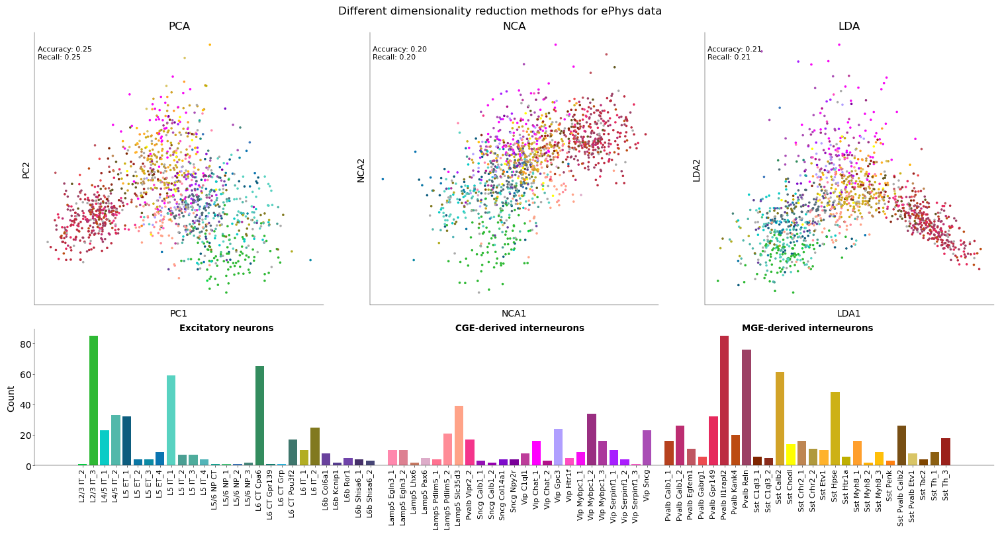

In [62]:
fig = plt.figure(figsize=(15, 8))

gs = GridSpec(2, 3, figure=fig, wspace=0.05, height_ratios=[2, 1])
# Create subplots with the specified gridspec
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
ax3 = fig.add_subplot(gs[1, :])


axs = [ax0, ax1, ax2]
for i, (key, value) in enumerate(reduced_data.items()):
    plot_dim1_dim2(
        ax=axs[i],
        data=reduced_data,
        labels=cluster_colors[keepcells],
        type=key,
        title=key,
        display_stats=True,
    )
plot_cell_types(neuron_groups, ax3)
plt.suptitle("Different dimensionality reduction methods for ePhys data")

The figure demonstrates that NCA and LDA methods for dimensionality reduction seem to be slightly more accurate than PCA. Since the difference is not dramatic, we will use PCA (being the most common method) further on.

### Representing ePhys data in PCA, TSNE and UMAP spaces. Performing and visuzalizing GMM-clustering on raw data.

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\583724656.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\583724656.py:107: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


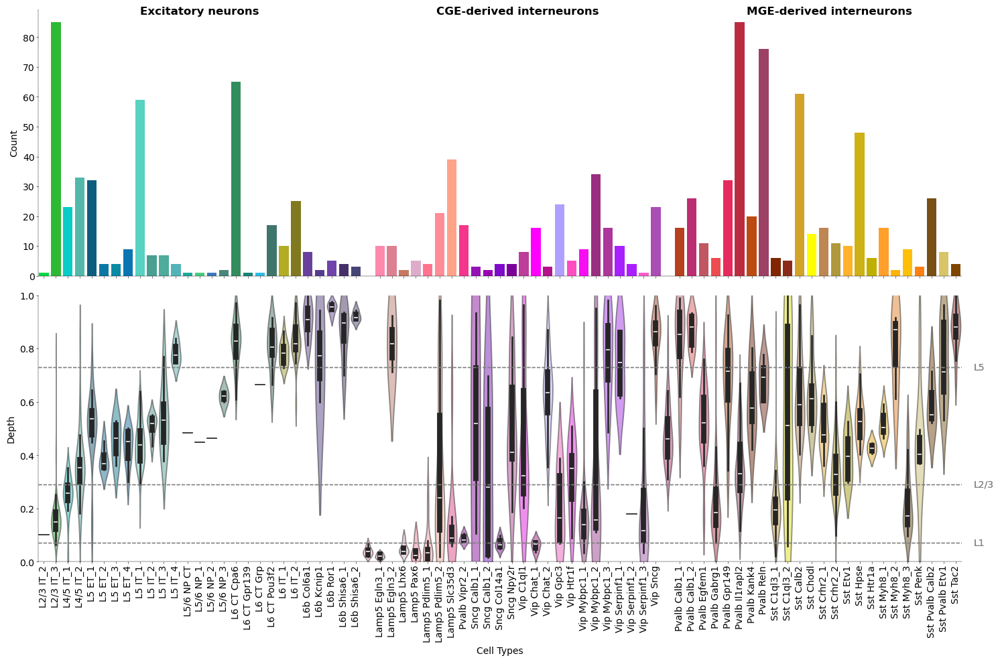

In [63]:
plot_cell_types_depth(neuron_groups, df_depth_per_type=df_depth_per_type)

c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\Arne.Gitte

Optimal number of clusters: 4


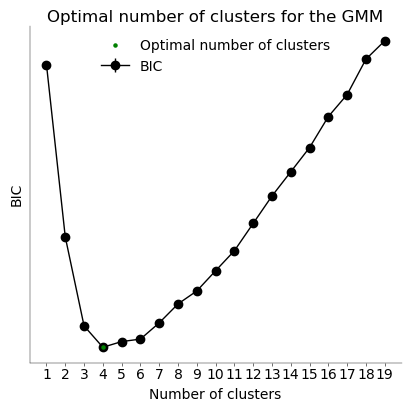

In [64]:
### GMM CLUSTERING ###
# set the range of possible cluster number
possible_clusters = np.arange(1, 20, 1)
num_seeds = 1

# get the optimal cluster number using BIC
ePhys_cluster_n = get_optimal_cluster_number(
    possible_clusters, num_seeds, ephysData_filtered, bic_mode="sklearn", plot=True
)

# fit the GMM model
ePhys_gmm = GMM(n_components=ePhys_cluster_n, random_state=42).fit(ephysData_filtered)

# get the cluster labels, means and covariances
ePhys_clusters = ePhys_gmm.predict(ephysData_filtered)
ePhys_clusters_means = ePhys_gmm.means_
ePhys_clusters_covariances = ePhys_gmm.covariances_

In [65]:
# transform cluster means and covariances to PCA space for plotting later
pca = make_pipeline(StandardScaler(), PCA(n_components=2))
pca_ePhys = pca.fit(Data)
ePhys_clusters_means = pca[pca.steps[-1][0]].transform(ePhys_clusters_means)
components = pca[pca.steps[-1][0]].components_
ePhys_clusters_covariances = [
    components @ cov @ components.T for cov in ePhys_clusters_covariances
]

#### t-SNE and UMAP

In [66]:
### t-SNE ###
# performing t-SNE on the ePhys data
ePhys_tsne = TSNE(init="pca", early_exaggeration=4, random_state=42).fit_transform(
    ephysData_filtered
)

In [67]:
### UMAP ###
# performing UMAP on the ePhys data
umap_ePhys = umap.UMAP(random_state=42).fit_transform(ephysData_filtered)

c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


#### Plot PCA-processed data with GMM clusters overlay and the t-SNE plot. Here we use original color labels from the paper

(27, 4)
(24, 4)
(26, 4)


c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\3099095034.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\3099095034.py:45: UserWarning: The f

Text(0.5, 0.98, 'PCA and tSNE of ePhys data with original labeling')

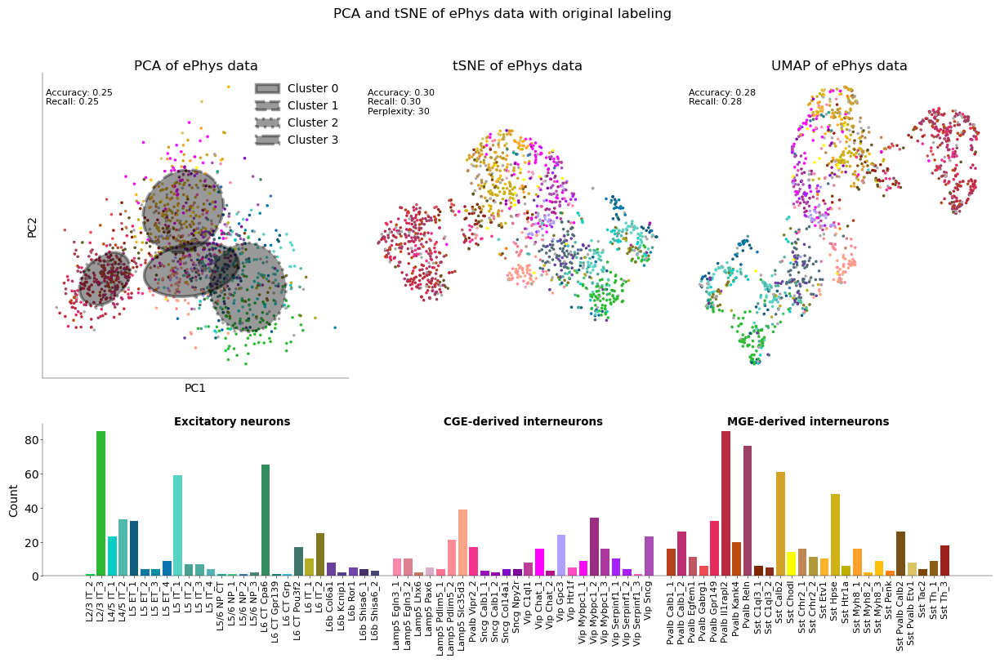

In [68]:
# pca_ePhys = pca_ePhys / np.std(pca_ePhys[:, 0]) * 0.0001

fig = plt.figure(figsize=(15, 8))

gs = GridSpec(2, 3, figure=fig, wspace=0.05, height_ratios=[2, 1])
# Create subplots with the specified gridspec
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
ax3 = fig.add_subplot(gs[1, :])


plot_dim1_dim2(
    ax0,
    reduced_data,
    cluster_colors[keepcells],
    "PCA of ePhys data",
    type="PCA",
    display_stats=True,
)
plot_TSNE(
    ax1,
    ePhys_tsne,
    cluster_colors[keepcells],
    "tSNE of ePhys data",
    display_accuracy=True,
)
plot_umap(
    ax2,
    umap_ePhys,
    cluster_colors[keepcells],
    "UMAP of ePhys data",
    display_accuracy=True,
)
plot_cell_types(neuron_groups, ax3, base_font_size=8)

plot_ellipse(
    ePhys_clusters_means,
    ePhys_clusters_covariances,
    ax=ax0,
    color="black",
    cluster_n=ePhys_cluster_n,
)
ax0.legend()
plt.tight_layout()
plt.suptitle("PCA and tSNE of ePhys data with original labeling", fontsize=12)

### Representing ePhys data in PCA, TSNE and UMAP spaces. Performing and visuzalizing GMM-clustering on PCA-processed data.

PCA accuracy: 0.25
PCA recall: 0.25
NCA accuracy: 0.20
NCA recall: 0.20
LDA accuracy: 0.21
LDA recall: 0.21


c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(
c:\Users\Arne.Gitte

Optimal number of clusters: 3


c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


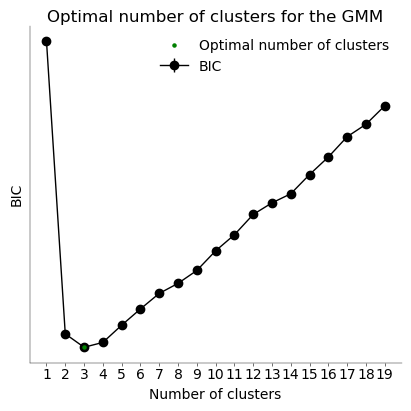

In [69]:
### Dimensionality reduction###
reduced_data_ = dim_reduction(ephysData_filtered, cluster_colors[keepcells])
pca_ePhys = reduced_data_["PCA"]["data"]
pca_ePhys_cluster_n = get_optimal_cluster_number(
    possible_clusters, num_seeds, pca_ePhys, bic_mode="sklearn", plot=True
)

### GMM CLUSTERING ###
pca_ePhys_gmm = GMM(n_components=pca_ePhys_cluster_n, random_state=42).fit(pca_ePhys)
pca_ePhys_clusters = pca_ePhys_gmm.predict(pca_ePhys)
pca_ePhys_clusters_means = pca_ePhys_gmm.means_
pca_ePhys_clusters_covariances = pca_ePhys_gmm.covariances_

(27, 4)
(24, 4)
(26, 4)


c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\3889043698.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\3889043698.py:44: UserWarning: The f

Text(0.5, 0.98, 'PCA and tSNE of ePhys data with original labeling')

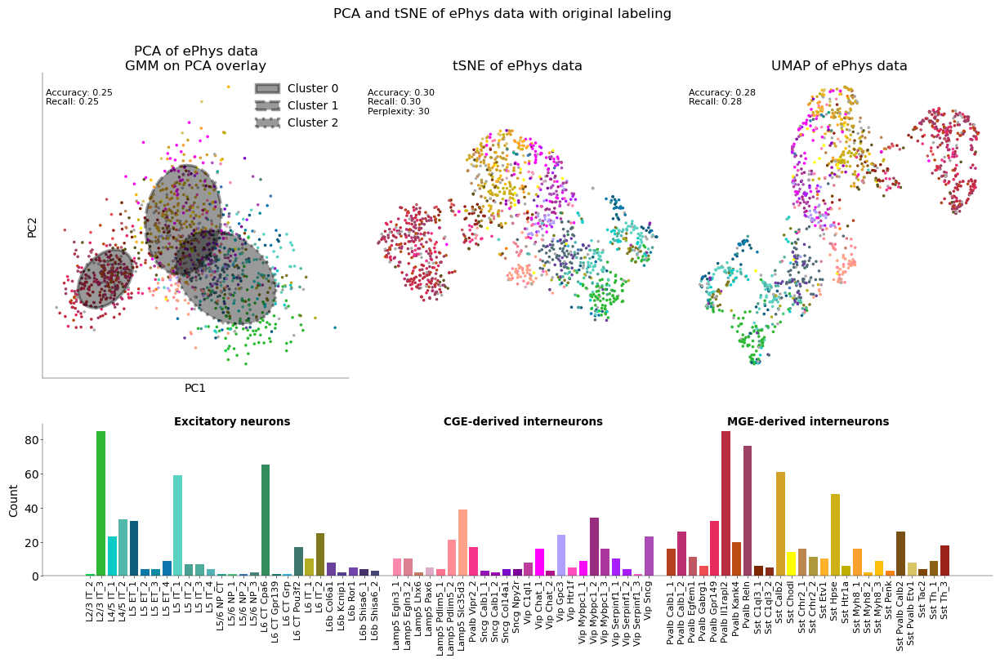

In [70]:
### PLOTTING ###
fig = plt.figure(figsize=(15, 8))

gs = GridSpec(2, 3, figure=fig, wspace=0.05, height_ratios=[2, 1])
# Create subplots with the specified gridspec
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[0, 2])
ax3 = fig.add_subplot(gs[1, :])


plot_dim1_dim2(
    ax0,
    reduced_data_,
    cluster_colors[keepcells],
    "PCA of ePhys data\nGMM on PCA overlay",
    type="PCA",
    display_stats=True,
)
plot_TSNE(
    ax1,
    ePhys_tsne,
    cluster_colors[keepcells],
    "tSNE of ePhys data",
    display_accuracy=True,
)
plot_umap(
    ax2,
    umap_ePhys,
    cluster_colors[keepcells],
    "UMAP of ePhys data",
    display_accuracy=True,
)
plot_cell_types(neuron_groups, ax3, base_font_size=8)

plot_ellipse(
    pca_ePhys_clusters_means,
    pca_ePhys_clusters_covariances,
    ax=ax0,
    color="black",
    cluster_n=pca_ePhys_cluster_n,
)
ax0.legend()
plt.tight_layout()
plt.suptitle("PCA and tSNE of ePhys data with original labeling", fontsize=12)

### Summary

Our analysis demonstrates that Pvalb MGE-derived interneurons are distinctly separated from other cell types in both PCA, t-SNE, and UMAP projections. This finding is consistent with the original study, aligning with the known characteristic of high firing rates in these interneurons. The Gaussian Mixture Model (GMM) clustering further validates this separation, both in PCA-reduced and raw data spaces.

Moreover, excitatory neurons form distinct clusters in all three dimensionality reduction techniques. The GMM applied to the raw data (with an optimal cluster number of 4) effectively segregates excitatory neurons. Conversely, the GMM applied to PCA-reduced data (optimal cluster number of 3) exhibits slightly reduced performance, misclassifying some CGE-derived interneurons within the excitatory neuron cluster.

In contrast, the CGE-derived and MGE-derived interneurons do not exhibit clear separation as whole families within the electrophysiological space. They are consistently clustered together, indicating overlapping electrophysiological properties that complicate their distinct classification using the methods applied.

K-nearest neighbors classification yields some information loss after PCA dimensionality reduction (0.33 accuracy in original data vs 0.22 in the PCA-space), which is a common trade-off in such analyses. TSNE and UMAP show better accuracy: 0.30 and 0.28 respectively.

As for the dimensionality reduction, the raw data might have more complex structures that GMM can capture better, leading to more clusters (4 vs 3). PCA simplifies the data, which might merge some of these structures into fewer clusters. Overall PCA-based clustering is more efficient and less prone to overfitting, but it might lose some finer details present in the raw data clustering.

### Plotting t-SNE wit different parameters


c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

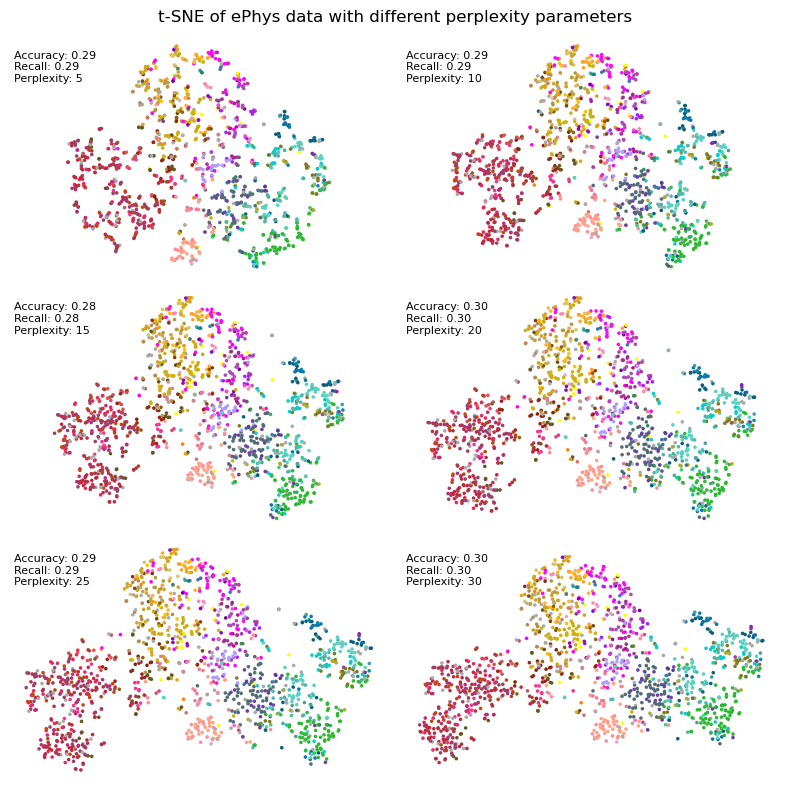

In [71]:
# Initialize list to store t-SNE results
TSNES = []

# Define range of perplexity values to test
perplexities = np.arange(5, 35, 5)

# Calculate number of rows and columns for subplots grid
num_plots = len(perplexities)
ncols = 2
nrows = (num_plots + ncols - 1) // ncols  # Ensure enough rows for the number of plots

# Set up subplots grid
fig, axs = plt.subplots(nrows, ncols, figsize=(8, 8))

# Flatten the axs array if it's 2D
if nrows * ncols > 1:
    axs = axs.flatten()

# Loop through perplexity values and perform t-SNE
for i, p in enumerate(perplexities):
    tsne = TSNE(perplexity=p, random_state=42).fit_transform(ephysData_filtered)
    TSNES.append(tsne)
    ax = axs[i]
    plot_TSNE(
        ax,
        tsne,
        cluster_colors[keepcells],
        title="",
        display_accuracy=True,
        perplexity=p,
    )

# Remove any empty subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Show the plot

plt.suptitle("t-SNE of ePhys data with different perplexity parameters", fontsize=12)
plt.tight_layout()

The figure shows that according to the k-nearest neighbors classification, TSNE with the perplexity parameter 30 has the highest accuracy. This is also the default parameter, which was used in other plots in this study

### Representing ePhys data in PCA, TSNE and UMAP spaces with previusly obtained GMM-labeling

In [72]:
gmm_reduced_data = dim_reduction(ephysData_filtered, ePhys_clusters)

PCA accuracy: 0.85
PCA recall: 0.85
NCA accuracy: 0.87
NCA recall: 0.87
LDA accuracy: 0.86
LDA recall: 0.86


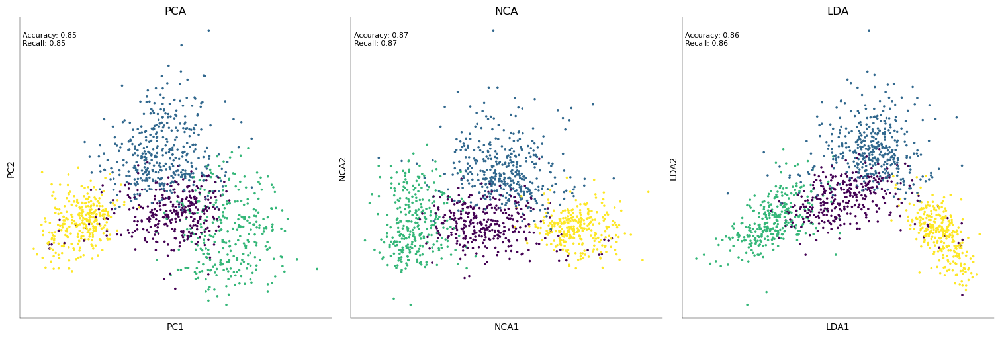

In [73]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
for i, (key, value) in enumerate(gmm_reduced_data.items()):
    plot_dim1_dim2(
        ax[i],
        gmm_reduced_data,
        ePhys_clusters,
        type=key,
        title=key,
        display_stats=True,
    )

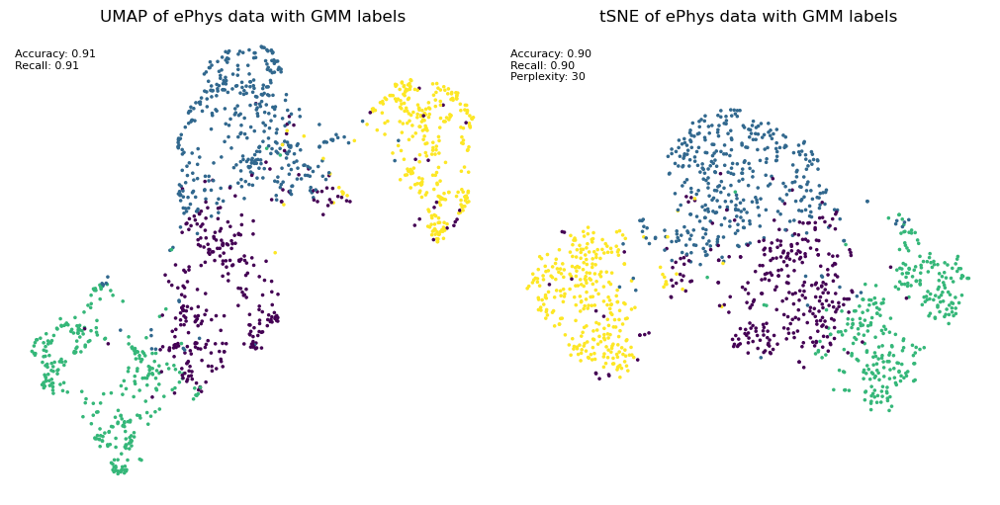

In [74]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

plot_umap(
    ax[0],
    umap_ePhys,
    ePhys_clusters,
    "UMAP of ePhys data with GMM labels",
    display_accuracy=True,
)
plot_TSNE(
    ax[1],
    ePhys_tsne,
    ePhys_clusters,
    "tSNE of ePhys data with GMM labels",
    display_accuracy=True,
)

#### We can compare GMM labeling with original lableing

c:\Users\Arne.Gittel\AppData\Local\anaconda3\envs\final_nds_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Text(0.5, 0.98, 'Comparison of PCA and t-SNE of ePhys data with original and GMM labels')

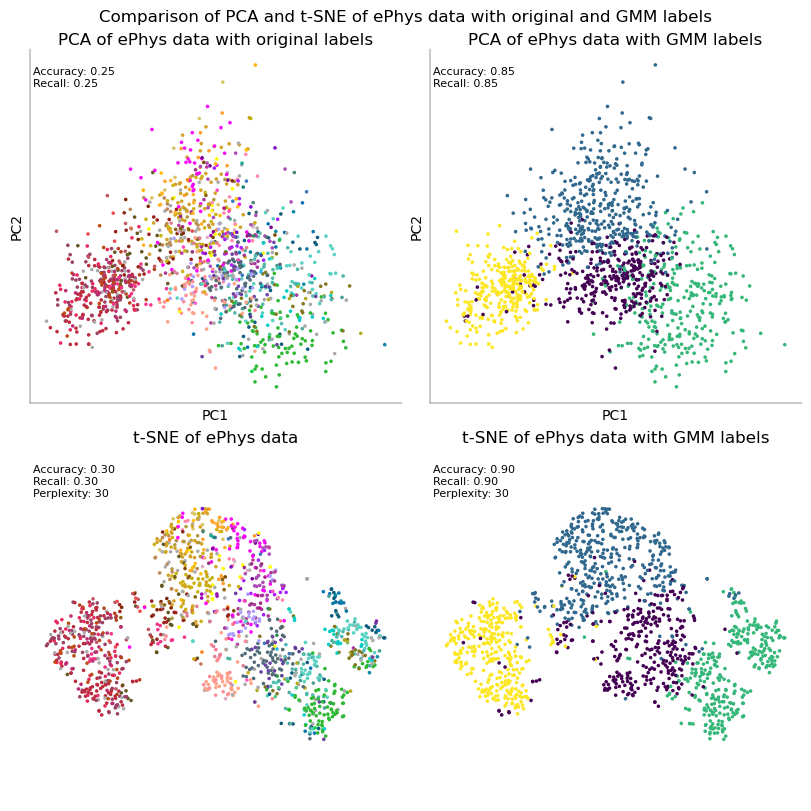

In [75]:
fig, ax = plt.subplots(2, 2, figsize=(8, 8))

plot_dim1_dim2(
    ax[0, 0],
    reduced_data,
    cluster_colors[keepcells],
    "PCA of ePhys data with original labels",
    type="PCA",
    display_stats=True,
)
plot_dim1_dim2(
    ax[0, 1],
    gmm_reduced_data,
    ePhys_clusters,
    "PCA of ePhys data with GMM labels",
    type="PCA",
    display_stats=True,
)


plot_TSNE(
    ax[1, 0],
    ePhys_tsne,
    cluster_colors[keepcells],
    "t-SNE of ePhys data",
    display_accuracy=True,
)
plot_TSNE(
    ax[1, 1],
    ePhys_tsne,
    ePhys_clusters,
    "t-SNE of ePhys data with GMM labels",
    display_accuracy=True,
)
plt.suptitle("Comparison of PCA and t-SNE of ePhys data with original and GMM labels")

### Summary

As discussed before, using GMM-clustering on raw data yields 4 clusters with high accuracy (assessed by k-nearest neighbors classification). These clusters are well separated in PCA, TSNE and UMAP spaces. Again, yellow cluster distinctively represents the Pvalb cells, while the green cluster corresponds to the excitatory cells. Blue and Purple clusters include a mixture of MGE- and CGE-derived interneurons, which are not well separable by their electrophysiological features. 

#### Creating K-nearest neighbors graph and Leiden partition for ePhys data 

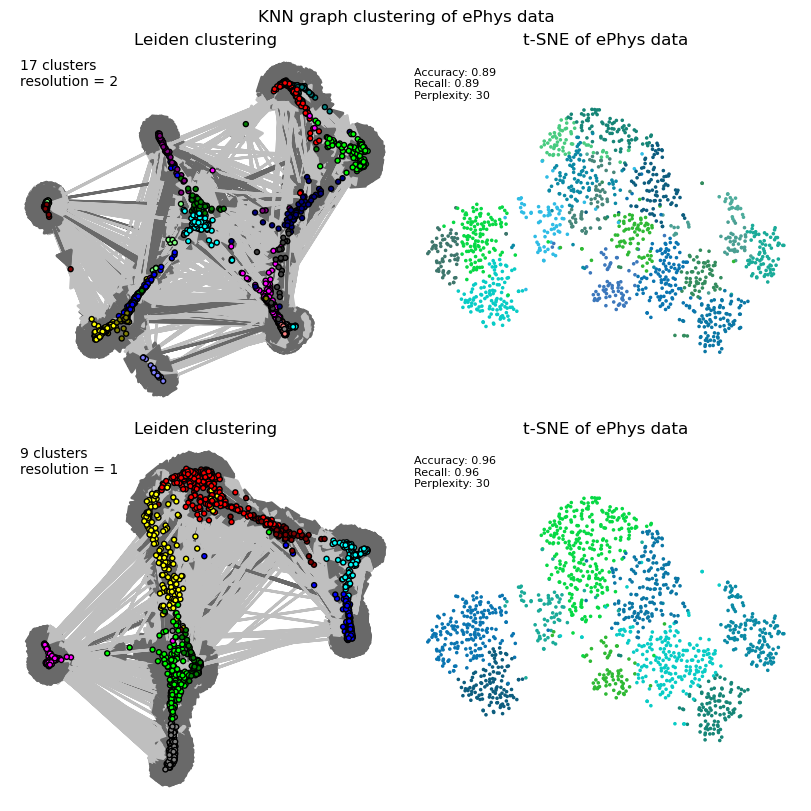

In [76]:
import igraph as ig
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import leidenalg as la


clusterCols = np.unique(cluster_colors)

data = ephysData_filtered

A = kneighbors_graph(data, 10, mode="connectivity", include_self=False)
sources, targets = A.nonzero()
G = ig.Graph(directed=True)
G.add_vertices(A.shape[0])
edges = list(zip(sources, targets))
G.add_edges(edges)

resolutions = [2, 1]

fig, ax = plt.subplots(2, 2, figsize=(8, 8))
for i in range(2):
    partition = la.find_partition(
        G,
        la.RBConfigurationVertexPartition,
        resolution_parameter=resolutions[i],
        seed=42,
    )

    ig.plot(
        partition,
        vertex_size=5,
        edge_curved=False,
        edgecolor="black",
        colors=clusterCols[partition.membership],
        target=ax[i][0],
    )
    ax[i][0].set_title("Leiden clustering")
    ax[i][0].text(
        0.025,
        0.9,
        f"{len(np.unique(partition.membership))} clusters\nresolution = {resolutions[i]}",
        transform=ax[i][0].transAxes,
    )

    plot_TSNE(
        ax[i][1],
        ePhys_tsne,
        clusterCols[partition.membership],
        "t-SNE of ePhys data",
        display_accuracy=True,
    )
    plt.suptitle("KNN graph clustering of ePhys data")

KNN clustering finds 17 and 9 clusters depending on the resolution parameter.

#### Plot selected electrophysiological features for the cells, clustered by GMM

C:\Users\Arne.Gittel\AppData\Local\Temp\ipykernel_2668\1137455490.py:45: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


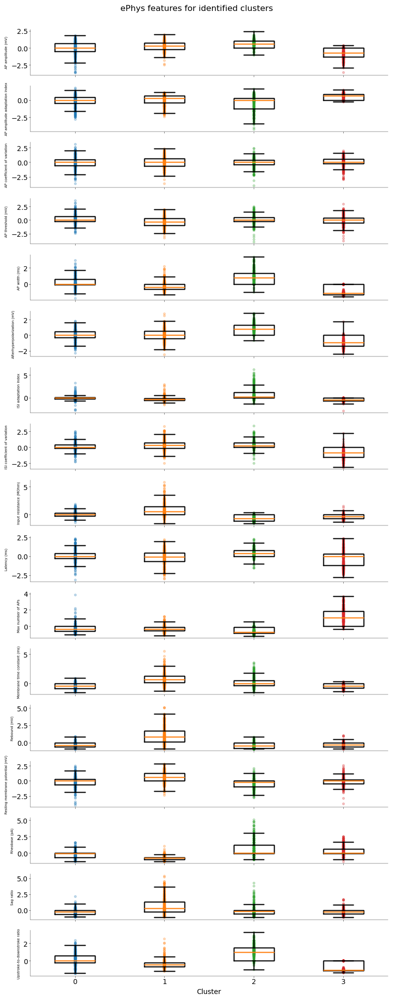

In [77]:
data = ephysData_filtered
features = ephysNames[~np.isin(ephysNames, features_exclude)]
mean_Per_group = np.zeros((len(features), len(np.unique(ePhys_clusters))))
std_Per_group = np.zeros((len(features), len(np.unique(ePhys_clusters))))
for i, c in enumerate(np.unique(ePhys_clusters)):
    mean_Per_group[:, i] = np.mean(data[ePhys_clusters == c, :], axis=0)
    std_Per_group[:, i] = np.std(data[ePhys_clusters == c, :], axis=0)


n_features = features.size
clusters_data = np.zeros((len(features), len(np.unique(ePhys_clusters)), data.shape[0]))

unique_clusters = np.unique(ePhys_clusters)
# Determine the max number of samples in any cluster
max_samples = max(np.sum(ePhys_clusters == c) for c in unique_clusters)

clusters_data = np.zeros((len(features), len(unique_clusters), max_samples))

for i, c in enumerate(unique_clusters):
    cluster_data = data[ePhys_clusters == c, :].T
    clusters_data[:, i, : cluster_data.shape[1]] = cluster_data

fig, ax = plt.subplots(len(features), 1, figsize=(8, 20), sharex=True)
for i, feature in enumerate(features):
    for j, c in enumerate(np.unique(ePhys_clusters)):
        ax[i].scatter(
            np.zeros(clusters_data.shape[2]) + j,
            clusters_data[i, j, :],
            # use the same colors as for gmm clusters
            color=plt.cm.tab10.colors[j],
            alpha=0.25,
        )
        ax[i].boxplot(
            clusters_data[i, :, :].T,
            positions=np.arange(len(np.unique(ePhys_clusters))),
            showfliers=False,
            patch_artist=False,
        )

    ax[i].set_xticks(np.arange(len(np.unique(ePhys_clusters))))
    ax[i].set_xticklabels(np.unique(ePhys_clusters))
    ax[i].set_ylabel(feature, fontsize=5)
    ax[i].set_xlabel("Cluster") if i == len(features) - 1 else None
plt.suptitle("ePhys features for identified clusters", y=1.001)
plt.tight_layout()

### Final Remarks

Comparing ePhys and transcriptomics space we can state that we found from 3 to 4 clusters using different dimensionality reduction and normalization techniques. However not in all cases obtained clusters allign well with the t-types. Furthermore we were able to pin down some genes that might be responsible for the diversity of the observed cells.